In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import scipy 
from scipy import integrate, optimize
from scipy.stats import chi2
from iminuit import minimize, Minuit

## Parameters definition
1. bins_related parameters
* bins_min: The minimum reco top mass (GeV)
* bins_max: The maximum reco top mass (GeV)
* bins_w: The width of each bin
* bins: The boundary of each bin i.g. 120, 121, 122
* The central value of bins will be generated by bins_mid
* bins_dense: Dense version of bins, which is used to draw fitted line

2. Top mass related parameters
* mass: True top mass
* top_mass_dense: Densly true top mass that is used to show the fit result

3. JSF related parameters
* JSF_arr: JSF arr that generates
* JSF_dense: Densly JSF that is used to show the fit result

4. Other parameters
* loglikeli_cut: klfitter loglikelihood cut, range between -80 to -50
* marginal_prob_cut: spanet marginal probility cut, range between 0 to 1
* tot_event: Total number of sudo experiment
* plt_xn, plt_yn: The x and y axis for drawing mutiple JSF value within one plt figure
* plt_fig: The size of plt figure of drawing multiple JSF
* colors: Control the color of drawings
* state_labels: The label of three states
* langau_fit_labels: The label of parameters for incorrect and unmatched pdf fit
* two_gau_fit_labels: The label of parameters for correct pdf fit

In [2]:
# Fixed the bins, colors, mass arr, and labels for all plots.
bins_min, bins_max, bins_w = 120, 230, 1
bins = np.arange(bins_min, bins_max+1, bins_w)
bins_mid = bins[:-1]+bins_w/2
bins_dense = np.linspace(bins_min, bins_max, 1000)

mass = [170, 171, 172, 173, 174, 175, 176]
top_mass_dense = np.linspace(170, 176, 1000)

JSF_arr = [0.97, 0.98, 0.99, 1.0, 1.01, 1.02, 1.03]
JSF_dense = np.linspace(0.97, 1.03, 1000)

loglikeli_cut_min = -78
loglikeli_cut_max = -55
marginal_prob_cut = 0.23

sudo_event = 1000

plt_xn, plt_yn = 2, 5
plt_fig = (30, 30*plt_xn/plt_yn)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
state_labels = ['Unmatched', 'Incorrect', 'Correct']
langau_fit_labels = ['Mean of Landau', 'Variance of Landau', 'Mean of Gaussian', 'Variance of Gaussian', 'Fraction of Gaussian']


## Function get_reco_top_mass
Input:
1. h5py_file (file containing the data)
2. target (spanet or klfitter)
3. JSF

Output:
1. reconstructed top mass
2. state (state of the top mass, 0 for unmatched, 1 for incorrect, and 2 for correct)
3. cuts: currently reco top mass cut (bins_min < reco top mass < bins_max)
4. loglikelihood value for klfitter; assignment, detection, and marginal probabilities for spanet

In [3]:
def get_reco_top_mass(h5py_file, target, JSF): # Target is spanet or klfitter
    dic = {}

    #Load pt, eta, phi, and mass from file. Where q1, q2 and b are the index.
    q1 = np.array([[i] for i in h5py_file[target + '/right_target/q1'][:]])
    dic['q1_pt'] = np.take_along_axis(h5py_file['jet_features/pt'][:], q1, axis=1).flatten()
    dic['q1_eta'] = np.take_along_axis(h5py_file['jet_features/eta'][:], q1, axis=1).flatten()
    dic['q1_phi'] = np.take_along_axis(h5py_file['jet_features/phi'][:], q1, axis=1).flatten()
    dic['q1_mass'] = np.take_along_axis(h5py_file['jet_features/mass'][:], q1, axis=1).flatten()

    q2 = np.array([[i] for i in h5py_file[target + '/right_target/q2'][:]])
    dic['q2_pt'] = np.take_along_axis(h5py_file['jet_features/pt'][:], q2, axis=1).flatten()
    dic['q2_eta'] = np.take_along_axis(h5py_file['jet_features/eta'][:], q2, axis=1).flatten()
    dic['q2_phi'] = np.take_along_axis(h5py_file['jet_features/phi'][:], q2, axis=1).flatten()
    dic['q2_mass'] = np.take_along_axis(h5py_file['jet_features/mass'][:], q2, axis=1).flatten()

    b = np.array([[i] for i in h5py_file[target + '/right_target/b'][:]])
    dic['b_pt'] = np.take_along_axis(h5py_file['jet_features/pt'][:], b, axis=1).flatten()
    dic['b_eta'] = np.take_along_axis(h5py_file['jet_features/eta'][:], b, axis=1).flatten()
    dic['b_phi'] = np.take_along_axis(h5py_file['jet_features/phi'][:], b, axis=1).flatten()
    dic['b_mass'] = np.take_along_axis(h5py_file['jet_features/mass'][:], b, axis=1).flatten()
    
    # px = pt*cos(phi)
    # py = pt*sin(phi)
    # pz = pt*sinh(eta)
    # E  = sqrt(m**2 + px**2 + py**2 + pz**2)*JSF
    dic['px1'] = dic['q1_pt']*np.cos(dic['q1_phi'])*JSF
    dic['py1'] = dic['q1_pt']*np.sin(dic['q1_phi'])*JSF
    dic['pz1'] = dic['q1_pt']*np.sinh(dic['q1_eta'])*JSF
    dic['E1'] = np.sqrt(dic['q1_mass']**2+dic['px1']**2+dic['py1']**2+dic['pz1']**2)

    dic['px2'] = dic['q2_pt']*np.cos(dic['q2_phi'])*JSF
    dic['py2'] = dic['q2_pt']*np.sin(dic['q2_phi'])*JSF
    dic['pz2'] = dic['q2_pt']*np.sinh(dic['q2_eta'])*JSF
    dic['E2'] = np.sqrt(dic['q2_mass']**2+dic['px2']**2+dic['py2']**2+dic['pz2']**2)

    dic['bx'] = dic['b_pt']*np.cos(dic['b_phi'])*JSF
    dic['by'] = dic['b_pt']*np.sin(dic['b_phi'])*JSF
    dic['bz'] = dic['b_pt']*np.sinh(dic['b_eta'])*JSF
    dic['bE'] = np.sqrt(dic['b_mass']**2+dic['bx']**2+dic['by']**2+dic['bz']**2)
    
    # M = sqrt((m1+m2)**2 + (px1+px2)**2 + (py1+py2)**2 + (pz1+pz2)**2)
    dic['reconstructed_top_mass'] = np.sqrt((dic['E1']+dic['E2']+dic['bE'])**2
                    - (dic['px1']+dic['px2']+dic['bx'])**2
                    - (dic['py1']+dic['py2']+dic['by'])**2
                    - (dic['pz1']+dic['pz2']+dic['bz'])**2)

    """
    cuts
    bins_min < reco_m_top < bins_max
    """
    reco_cuts = np.logical_and(dic['reconstructed_top_mass'] > bins_min, dic['reconstructed_top_mass'] < bins_max)

    # Check the state of the event.
    state = [1]*len(h5py_file['target/right_target/q1'][:])

    # Two permutations for q1 and q2.
    permu1 = np.logical_and(h5py_file['target/right_target/q1'][:] == h5py_file[target + '/right_target/q1'][:], 
                        h5py_file['target/right_target/q2'][:] == h5py_file[target + '/right_target/q2'][:])
    permu2 = np.logical_and(h5py_file['target/right_target/q1'][:] == h5py_file[target + '/right_target/q2'][:], 
                        h5py_file['target/right_target/q2'][:] == h5py_file[target + '/right_target/q1'][:])
    correct = np.logical_and(np.logical_or(permu1, permu2), h5py_file['target/right_target/b'][:] == h5py_file[target + '/right_target/b'][:])
    state = np.where(correct, 2, state)

    # Check for unmatch
    unmatch = np.logical_or.reduce((h5py_file['target/right_target/q1'][:] == -1,
                        h5py_file['target/right_target/q2'][:] == -1,
                        h5py_file['target/right_target/b'][:] == -1))
    state = np.where(unmatch, 0, state)
    if target == 'klfitter': return dic['reconstructed_top_mass'], state, reco_cuts, np.logical_and(h5py_file['klfitter/score/loglikelihood'][:]>loglikeli_cut_min, h5py_file['klfitter/score/loglikelihood'][:]<loglikeli_cut_max)
    elif target == 'spanet': return dic['reconstructed_top_mass'], state, reco_cuts, h5py_file['spanet/right_target/marginal_probability'][:]>marginal_prob_cut
    

## Data input
Using the function get_reco_top_mass to retrieve the data from the h5py files

In [4]:
# The reco_top_mss from ttbar_testing_mass_variation
# 0 for unmatched, 1 for incorrect, 2 for correct
reco_klf_dic, state_klf_dic, cut_klf_dic, likeli_klf_dic = {}, {}, {}, {}
reco_spanet_dic, state_spanet_dic, cut_spanet_dic, likeli_spanet_dic = {}, {}, {}, {}

for m in mass:
    h5py_file = h5py.File('ttbar_testing_mass_variation/ttbar_testing_{}_gev_with_spanet_pdnn_KLFitter.h5'.format(m), "r")
    for JSF in JSF_arr:
        reco_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)], cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]  = get_reco_top_mass(h5py_file, 'klfitter', JSF)
        reco_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)], cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)] = get_reco_top_mass(h5py_file, 'spanet', JSF)


In [14]:
# Sum of a Landau distribution and a gaussian distribution. Landau currently uses moyal as approximation.
# Nomalized
def langau(x, lan_loc, lan_scale, gau_loc, gau_scale, f):
    lan_y = (x-lan_loc)/lan_scale
    gau_y = (x-gau_loc)/gau_scale
    return (1-f)*np.exp(-(lan_y+np.exp(-lan_y))/2)/np.sqrt(2*np.pi)/lan_scale + f*np.exp(-gau_y**2/2)/np.sqrt(2*np.pi)/gau_scale

# Normalized between bins_min and bins_max
def langau_norm(x, lan_loc, lan_scale, gau_loc, gau_scale, f):
    return langau(x, lan_loc, lan_scale, gau_loc, gau_scale, f)/integrate.quad(langau, x[0]-bins_w/2, x[-1]+bins_w/2, args=(lan_loc, lan_scale, gau_loc, gau_scale, f))[0]

# Gaussian distributions.
def gau_norm(x, gau_loc1, gau_scale1):
    gau_y1 = (x-gau_loc1)/gau_scale1
    return np.exp(-gau_y1**2/2)/np.sqrt(2*np.pi)/gau_scale1

# Linear
def linear(x, a, b):
    return a*x+b

# Function to construct PDF parameters
def linear_linear(x, a, b, c, d):
    return (a + b*(x[0]-173)) * (c + d*(x[1]-1))

def linear_parabola(x, a, b, c, d, e):
    return (a + b*(x[0]-173)) * (c + d*(x[1]-1) + e*(x[1]-1)**2)

def fcn(lan_loc, lan_scale, gau_loc, gau_scale, f):
    return -2*np.sum(hist*np.log(langau_norm(bins_mid, lan_loc, lan_scale, gau_loc, gau_scale, f)))

#observed is the observation, pdf is the normalized height of the bins from pdf.
def chi2_pdf(observed, pdf):
    n1, _ = np.histogram(observed, bins=bins)
    n2 = pdf*bins_w*len(observed)
    return np.sum((n1-n2)**2/n2)

## Fraction of each state (class)

In [6]:
ratio_klf_dic = {i:{} for i in [0, 1, 2]}
for m in mass:
    for JSF in JSF_arr:
        for state_i in [0, 1, 2]:
            ratio = np.count_nonzero(state_klf_dic[(m, JSF)][np.logical_and(cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)])]==state_i)/len(state_klf_dic[(m, JSF)][np.logical_and(cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)])])
            ratio_klf_dic[state_i][(m, JSF)] = ratio

fpdf_klf_popt = {}
fpdf_klf_perr = {}
for state_i in [0, 1, 2]:
    popt, pcov = optimize.curve_fit(linear_parabola, np.transpose(list(ratio_klf_dic[state_i].keys())), [ratio_klf_dic[state_i][key] for key in ratio_klf_dic[state_i]], p0 = (0.33, 0, 1, 0, 0), bounds=((0, -0.1, 0, -1, -10), (2, 0.1, 2, 1, 10)))
    perr = np.sqrt(np.diag(pcov))
    fpdf_klf_popt[state_i] = popt
    fpdf_klf_perr[state_i] = perr

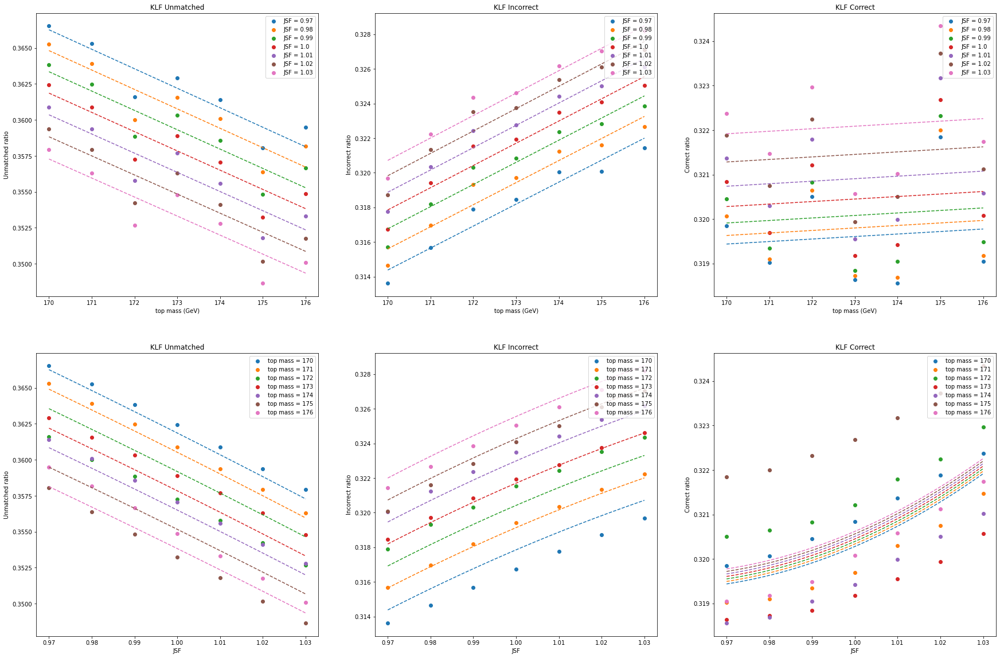

In [7]:
plt.figure(figsize=(30,20))
for state_i in [0, 1, 2]:
    
    plt.subplot(2, 3, state_i+1)
    for JSF in JSF_arr:
        plt.scatter(mass, [ratio_klf_dic[state_i][(m, JSF)] for m in mass], label='JSF = {}'.format(JSF))
        plt.plot(top_mass_dense, linear_parabola([top_mass_dense, np.array([JSF]*1000)], *fpdf_klf_popt[state_i]), '--')
    plt.title('KLF ' + state_labels[state_i])
    plt.xlabel('top mass (GeV)')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')

    plt.subplot(2, 3, state_i+4)
    for m in mass:
        plt.scatter(JSF_arr, [ratio_klf_dic[state_i][(m, JSF)] for JSF in JSF_arr], label='top mass = {}'.format(m))
        plt.plot(JSF_dense, linear_parabola([np.array([m]*1000), JSF_dense], *fpdf_klf_popt[state_i]), '--')
    plt.title('KLF ' + state_labels[state_i])
    plt.xlabel('JSF')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')
plt.show()

In [8]:
ratio_spanet_dic = {i:{} for i in [0, 1, 2]}
for m in mass:
    for JSF in JSF_arr:
        for state_i in [0, 1, 2]:
            ratio = np.count_nonzero(state_spanet_dic[(m, JSF)][np.logical_and(cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)])]==state_i)/len(state_spanet_dic[(m, JSF)][np.logical_and(cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)])])
            ratio_spanet_dic[state_i][(m, JSF)] = ratio

fpdf_spanet_popt = {}
fpdf_spanet_perr = {}
for state_i in [0, 1, 2]:
    popt, pcov = optimize.curve_fit(linear_parabola, np.transpose(list(ratio_spanet_dic[state_i].keys())), [ratio_spanet_dic[state_i][key] for key in ratio_spanet_dic[state_i]], p0 = (0.33, 0, 1, 0, 0), bounds=((0, -0.1, 0, -1, -10), (2, 0.1, 2, 1, 10)))
    perr = np.sqrt(np.diag(pcov))
    fpdf_spanet_popt[state_i] = popt
    fpdf_spanet_perr[state_i] = perr

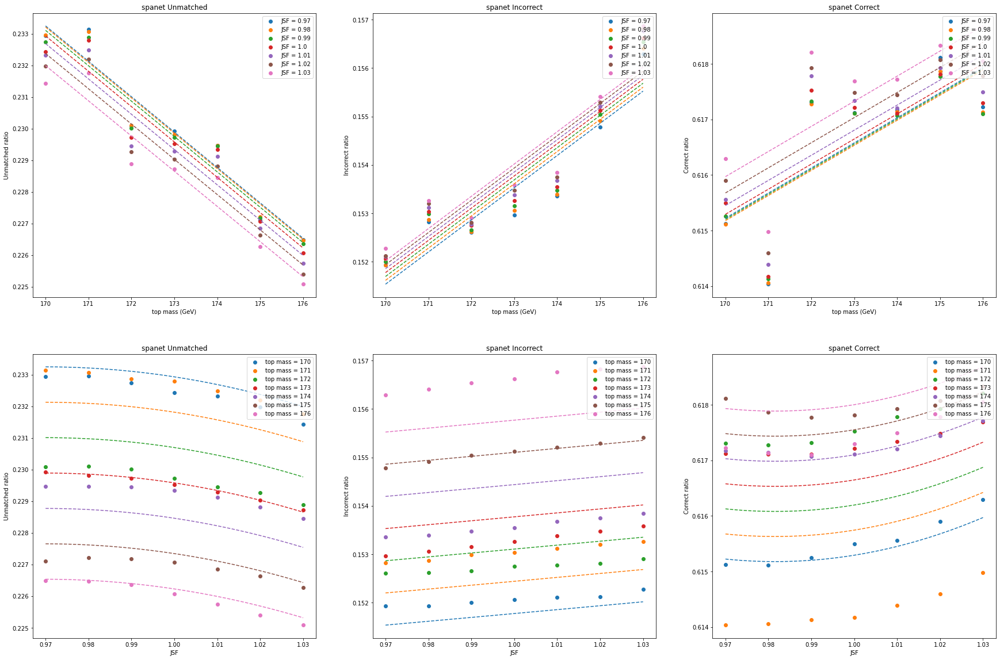

In [9]:
plt.figure(figsize=(30,20))
for state_i in [0, 1, 2]:

    plt.subplot(2, 3, state_i+1)
    for JSF in JSF_arr:
        plt.scatter(mass, [ratio_spanet_dic[state_i][(m, JSF)] for m in mass], label='JSF = {}'.format(JSF))
        plt.plot(top_mass_dense, linear_parabola([top_mass_dense, np.array([JSF]*1000)], *fpdf_spanet_popt[state_i]), '--')
    plt.title('spanet ' + state_labels[state_i])
    plt.xlabel('top mass (GeV)')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')

    plt.subplot(2, 3, state_i+4)
    for m in mass:
        plt.scatter(JSF_arr, [ratio_spanet_dic[state_i][(m, JSF)] for JSF in JSF_arr], label='top mass = {}'.format(m))
        plt.plot(JSF_dense, linear_parabola([np.array([m]*1000), JSF_dense], *fpdf_spanet_popt[state_i]), '--')
    plt.title('spanet ' + state_labels[state_i])
    plt.xlabel('JSF')
    plt.ylabel(state_labels[state_i] + ' ratio')
    plt.legend(loc='upper right')
plt.show()

## PDF fit and PDF parameters fit

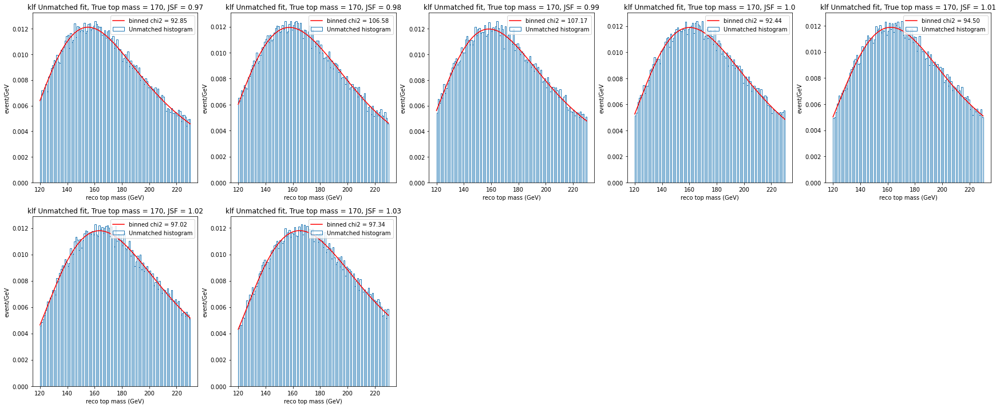

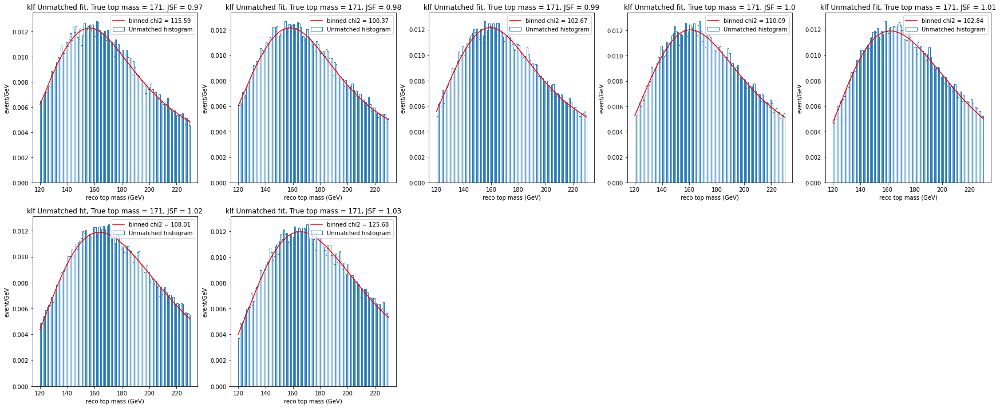

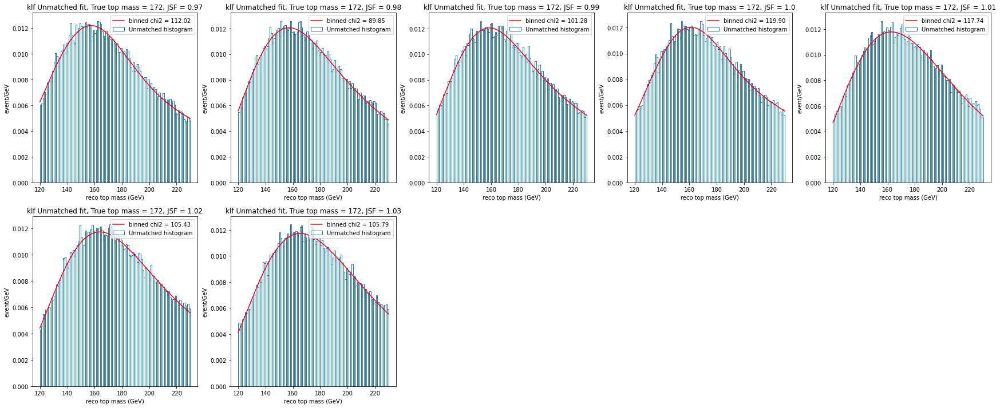

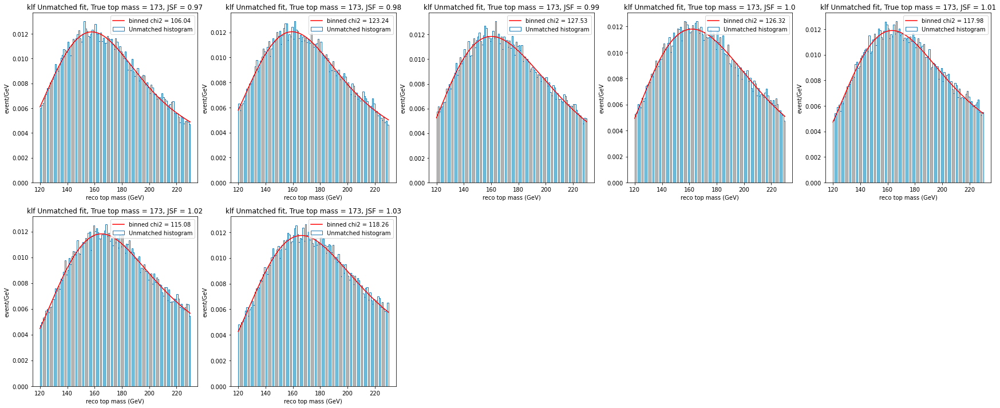

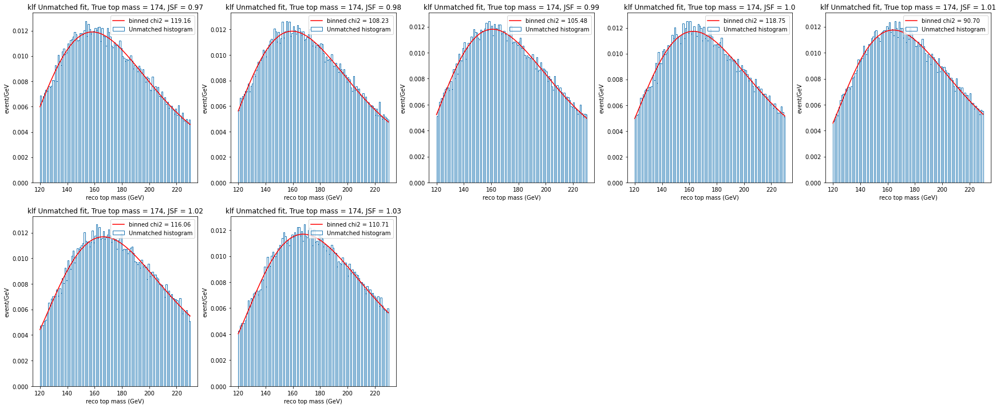

...

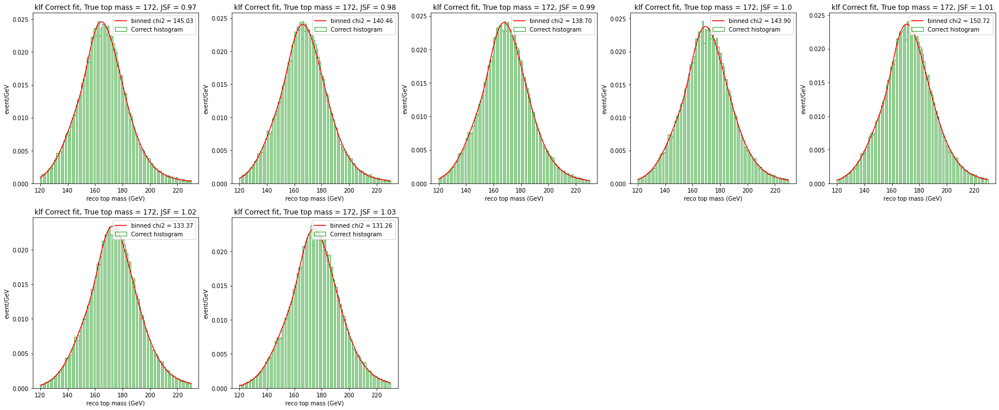

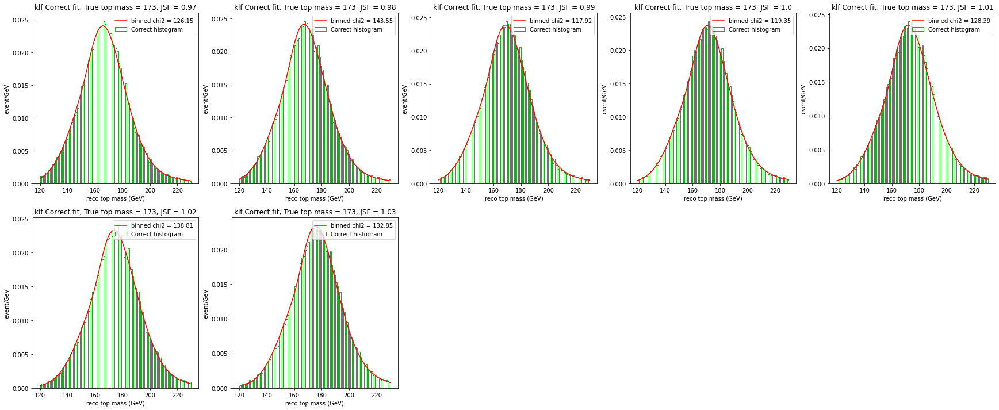

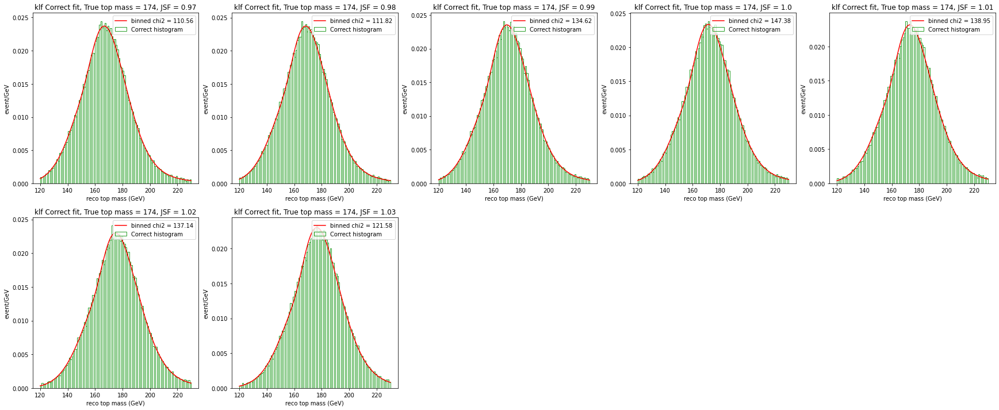

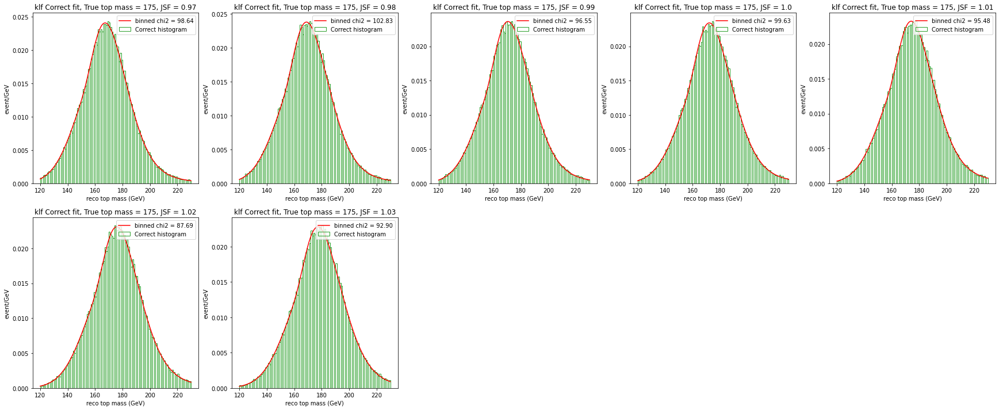

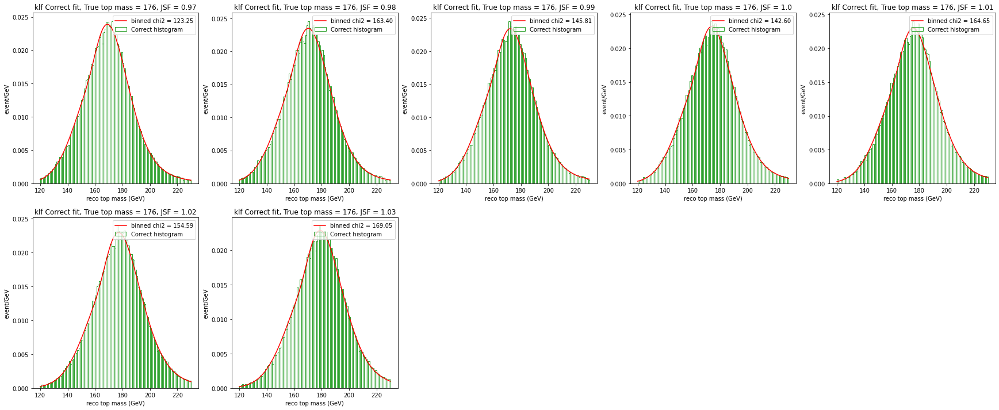

In [15]:
# Fit every klfitter state
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=plt_fig)
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(plt_xn, plt_yn, i+1)
            fit_target = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)]==state_i))]
            hist, _ = np.histogram(fit_target, bins=bins, density=True)
            minuit = Minuit(fcn, 170, 30, 170, 30, 0.5)
            minuit.limits = [(100, 250), (5, 50), (100, 250), (10, 50), (0.1, 0.9)]
            minuit.migrad(iterate=1000)
            minuit.minos()
            popt = list(minuit.values)
            errors = list(minuit.errors)
            y_dense = langau_norm(bins_dense, *popt)
            chi2 = chi2_pdf(fit_target, langau_norm(bins_mid, *popt))
            plt.plot(bins_dense, y_dense, c='r', label='binned chi2 = {:.2f}'.format(chi2))
            plt.bar(bins_mid, hist, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
            fit_popt_dic[state_i][(m, JSF)] = popt
            fit_perr_dic[state_i][(m, JSF)] = errors
            plt.title('klf {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc='upper right')
        plt.show()

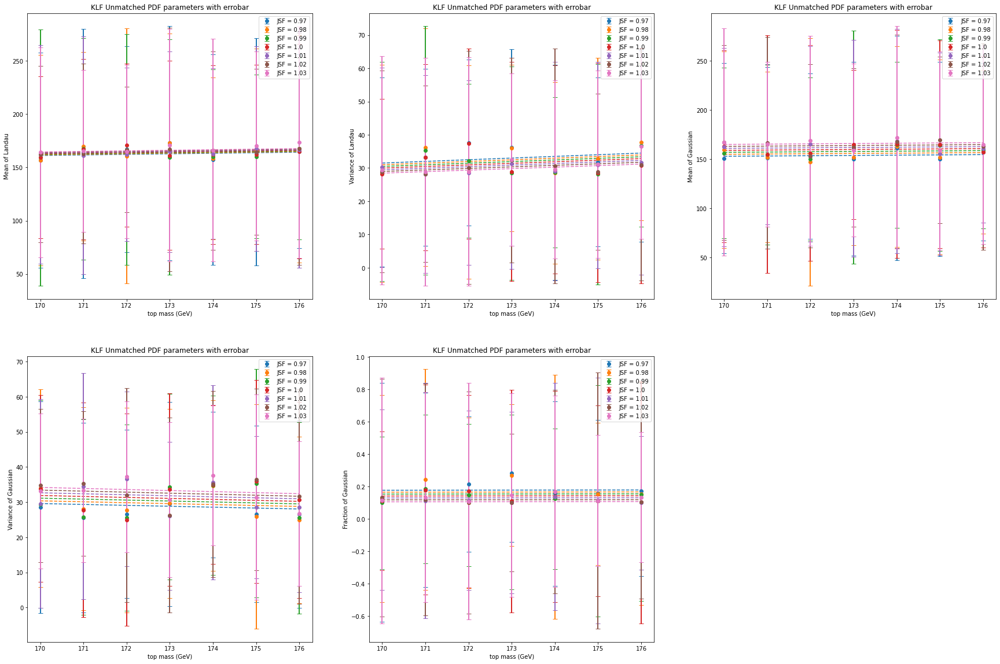

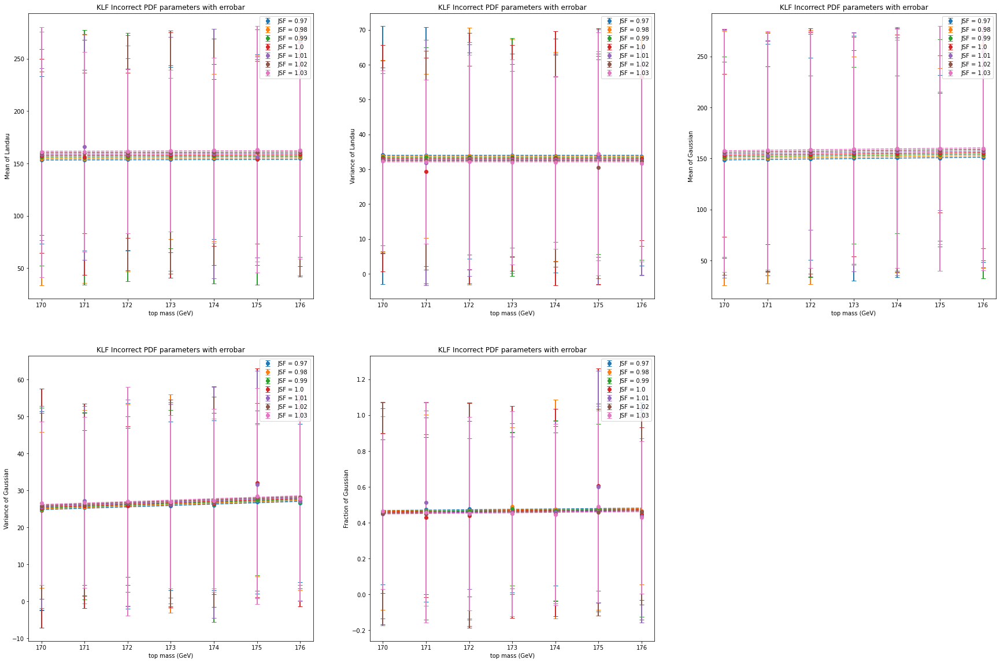

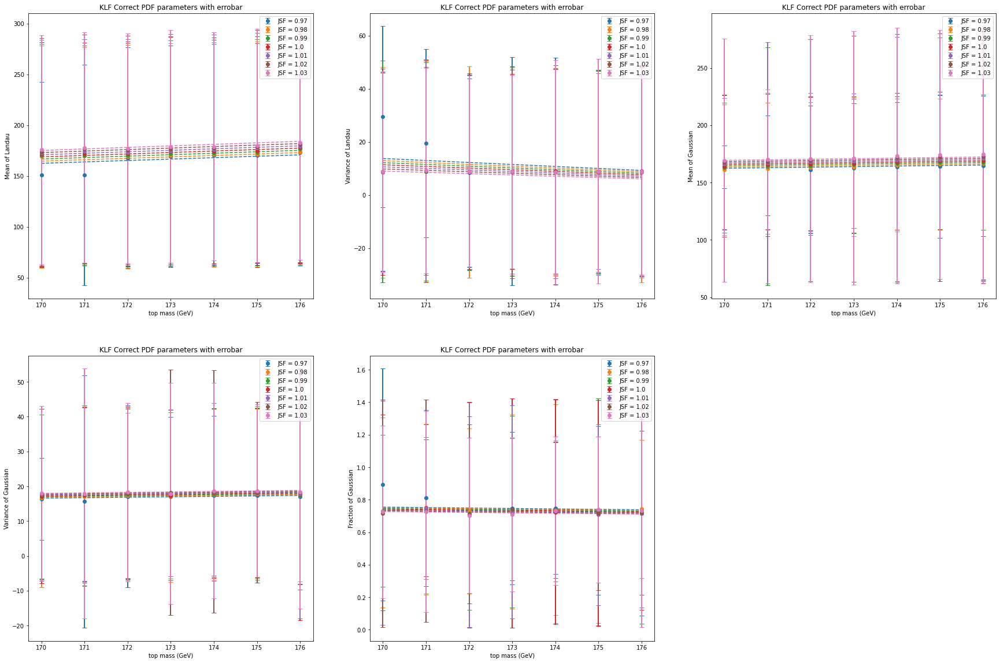

In [16]:
pdf_klf_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_klf_dic[(state_i, i)] = popt

        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('KLF {} PDF parameters with errobar'.format(state_labels[state_i]))
        plt.xlabel('top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

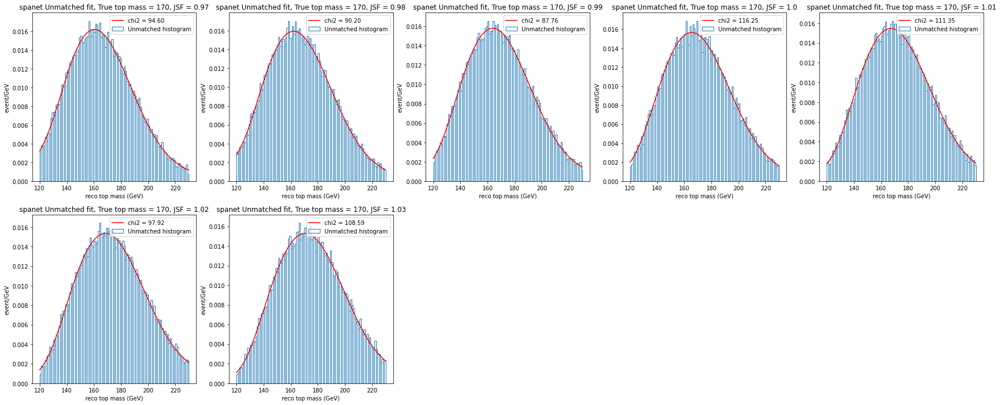

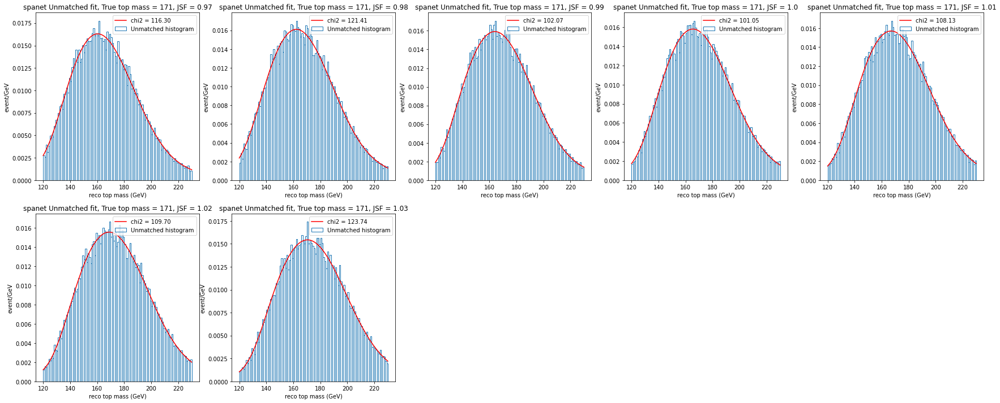

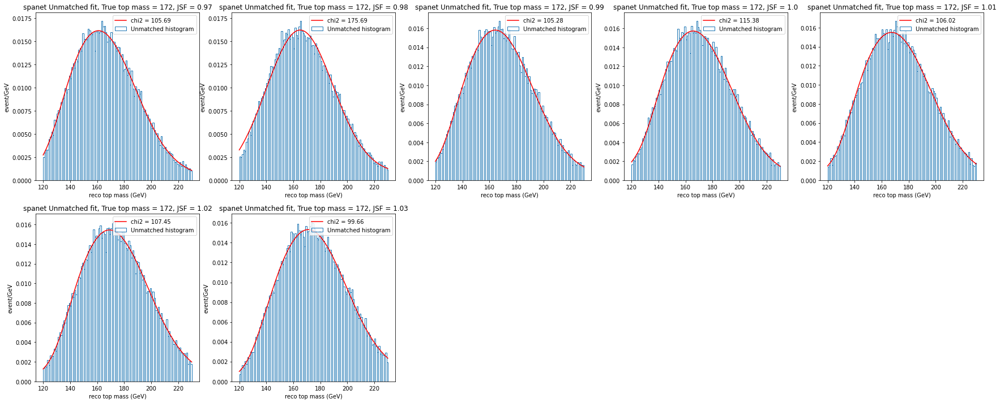

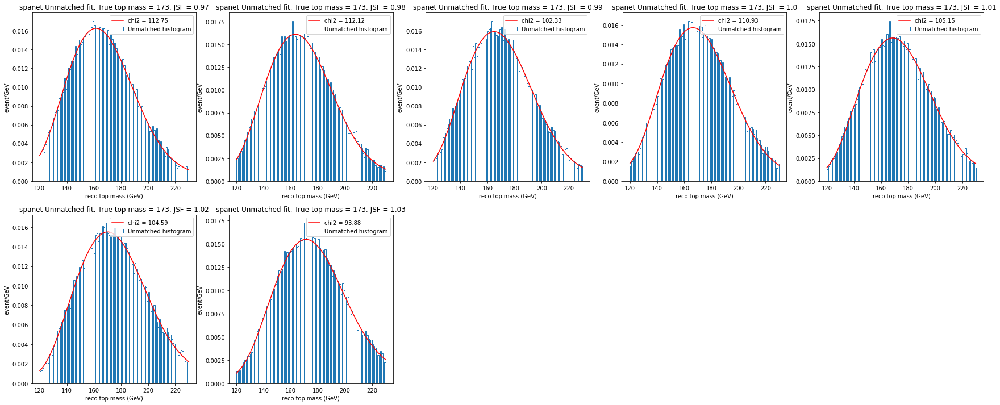

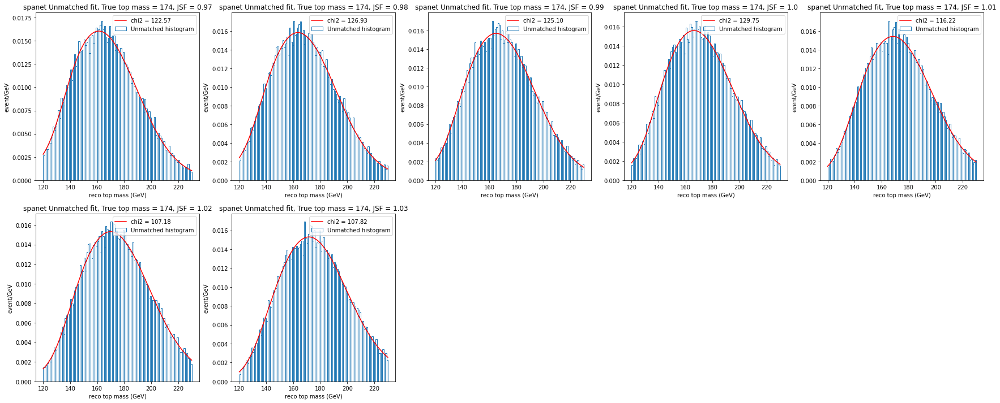

...

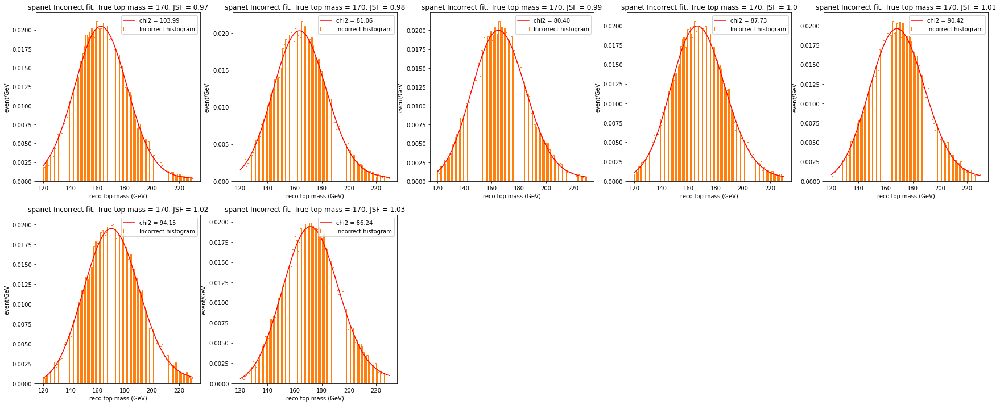

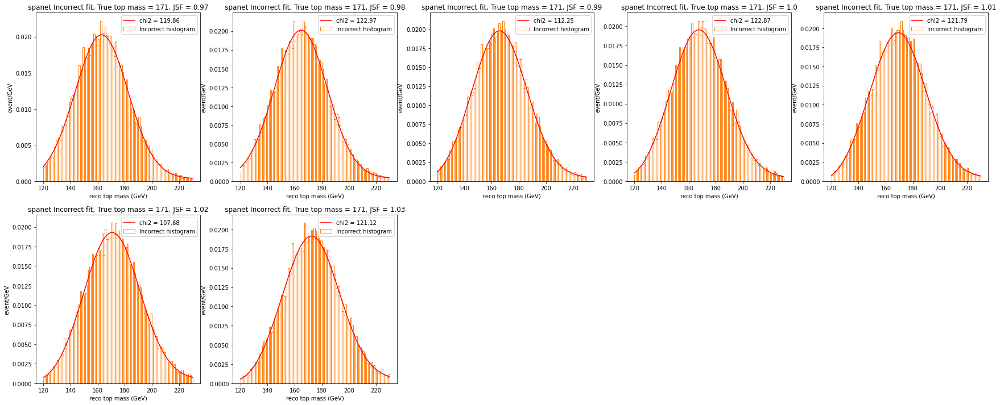

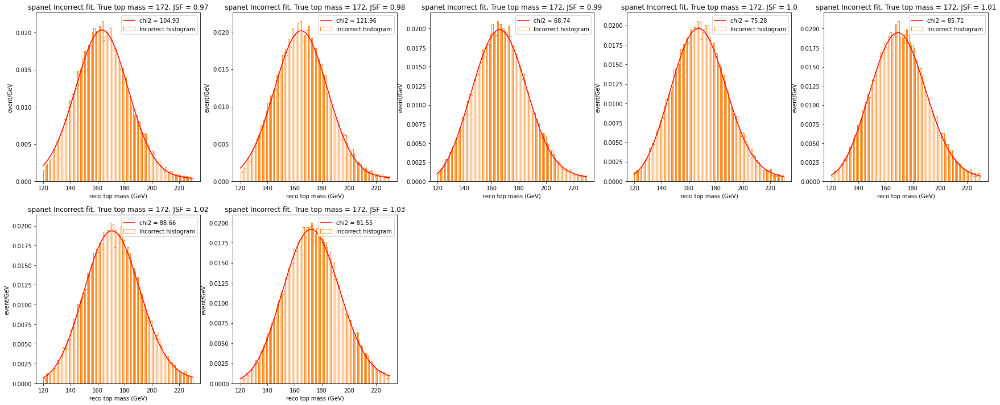

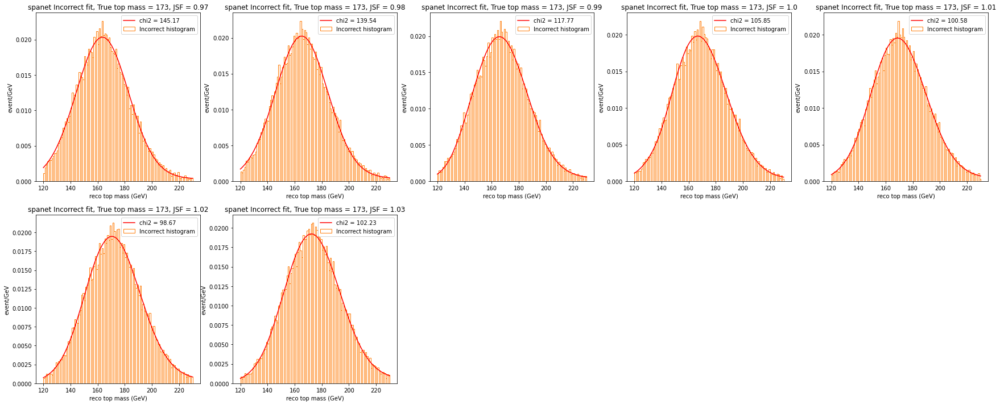

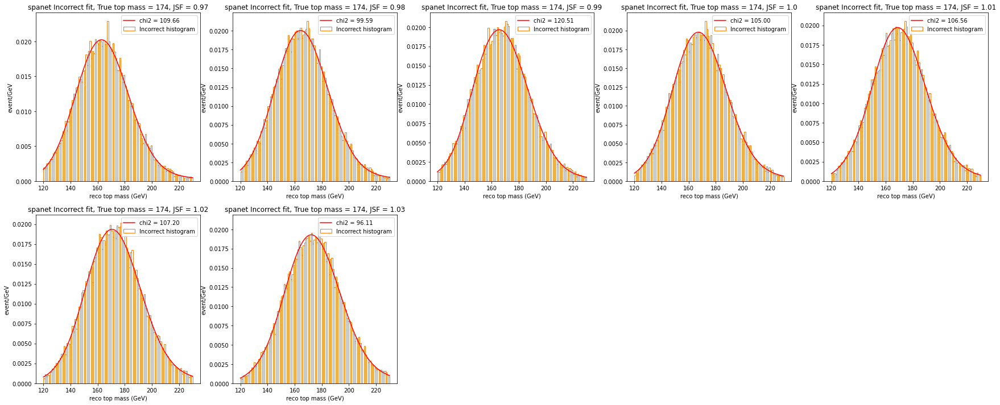

/tmp/ipykernel_17691/1843697486.py:10: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return langau(x, lan_loc, lan_scale, gau_loc, gau_scale, f)/integrate.quad(langau, x[0]-bins_w/2, x[-1]+bins_w/2, args=(lan_loc, lan_scale, gau_loc, gau_scale, f))[0]


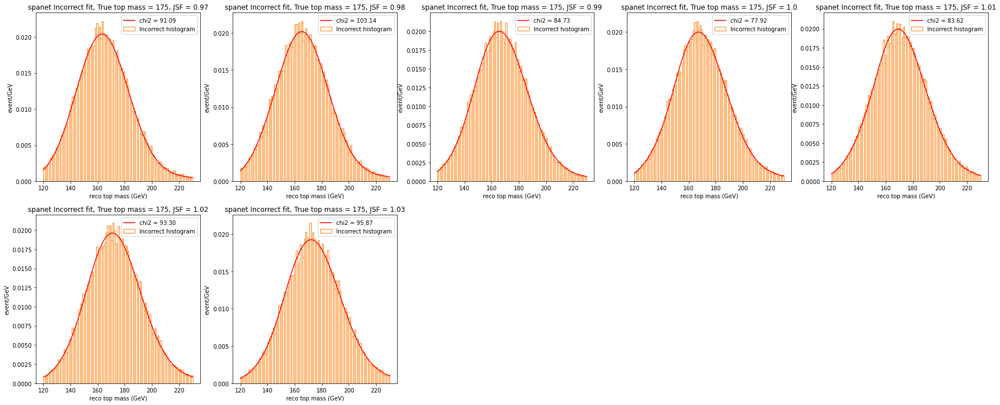

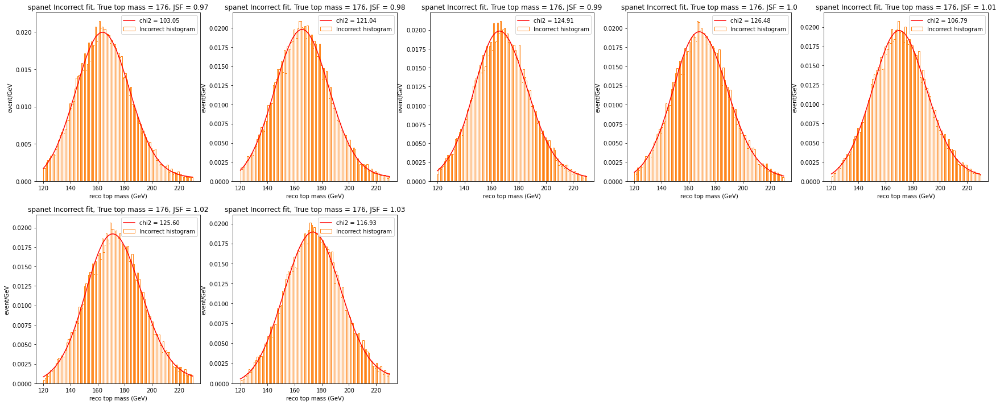

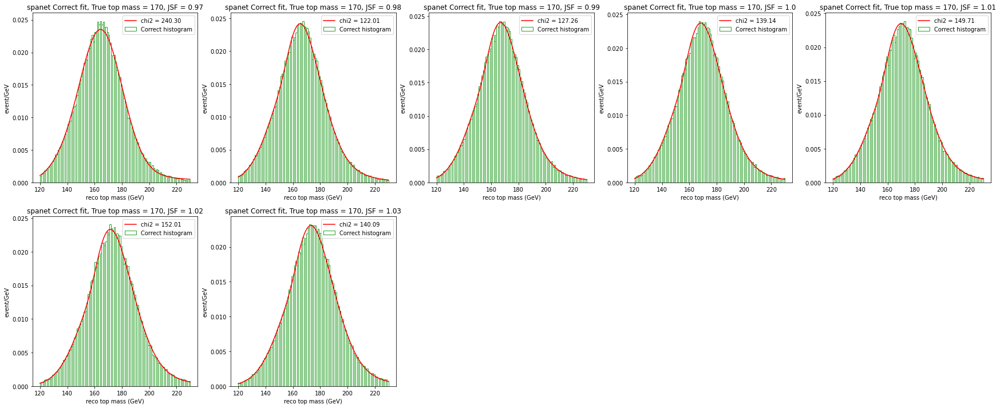

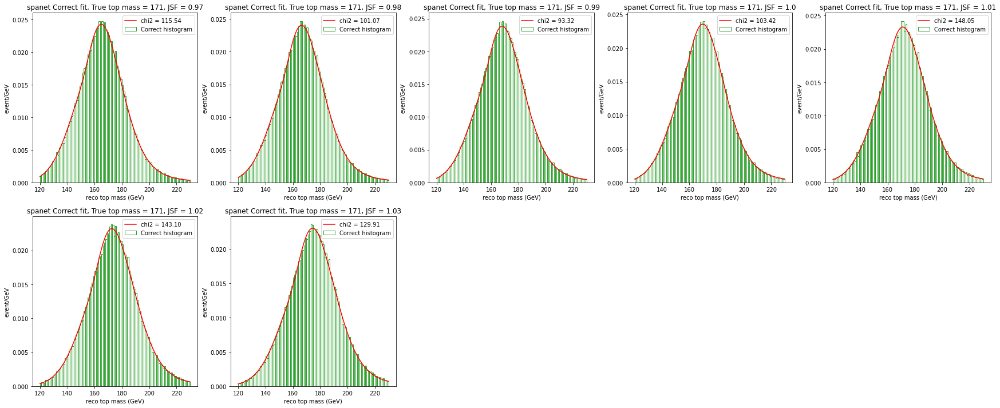

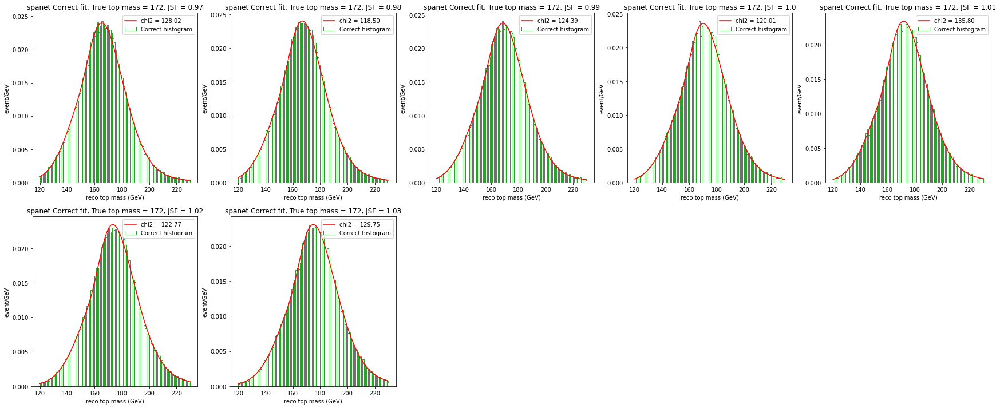

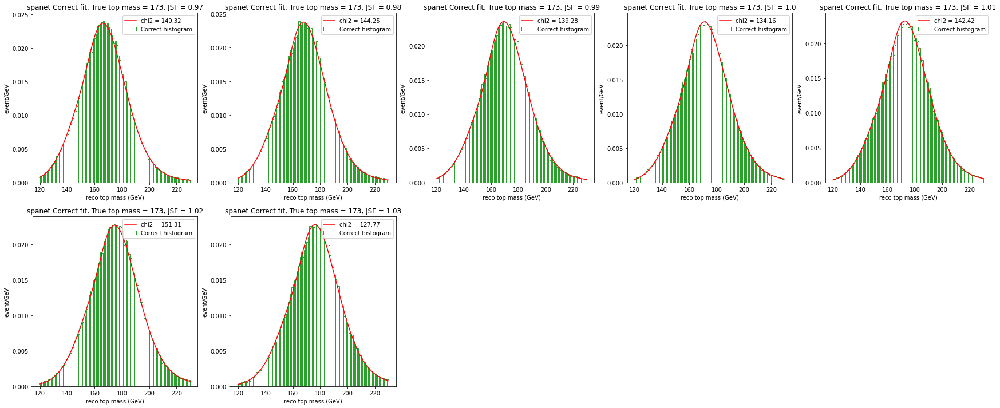

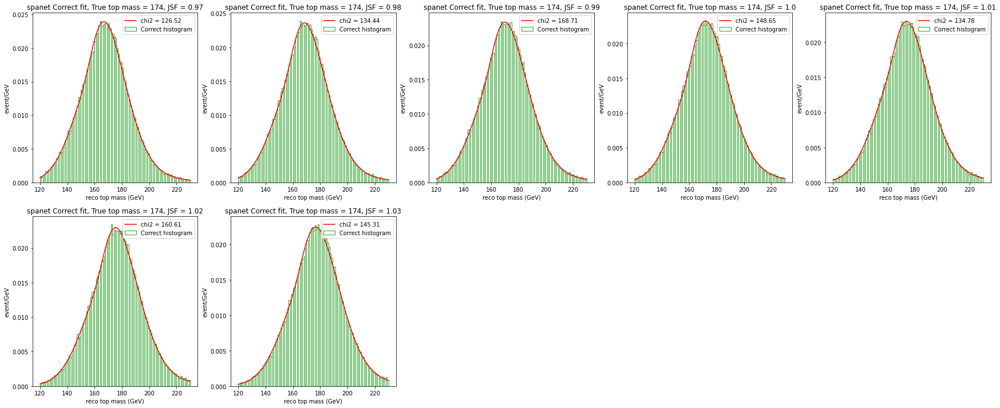

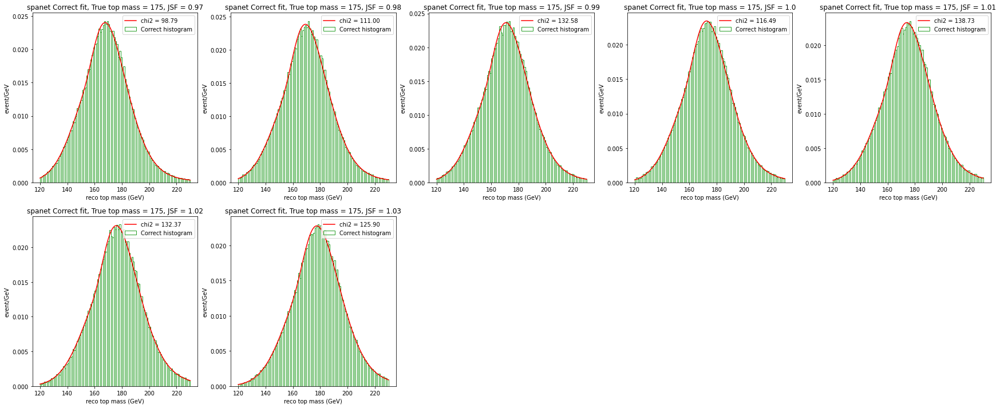

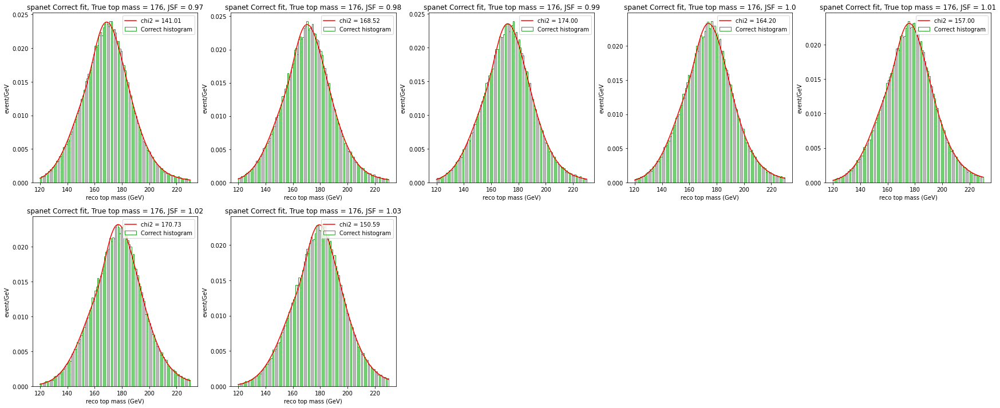

In [17]:
# Fit every spanet state
fit_popt_dic = {i:{} for i in [0, 1, 2]}
fit_perr_dic = {i:{} for i in [0, 1, 2]}

for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=plt_fig)
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(plt_xn, plt_yn, i+1)
            fit_target = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=bins, density=True)
            minuit = Minuit(fcn, 170, 30, 170, 30, 0.5)
            minuit.limits = [(100, 250), (5, 50), (100, 250), (10, 50), (0.1, 0.9)]
            minuit.migrad(iterate=1000)
            minuit.minos()
            popt = list(minuit.values)
            errors = list(minuit.errors)
            y_dense = langau_norm(bins_dense, *popt)
            chi2 = chi2_pdf(fit_target, langau_norm(bins_mid, *popt))
            fit_popt_dic[state_i][(m, JSF)] = popt
            fit_perr_dic[state_i][(m, JSF)] = errors
            plt.bar(bins_mid, hist, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(bins_dense, y_dense, c='r', label='chi2 = {:.2f}'.format(chi2))
            plt.title('spanet {} fit, True top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

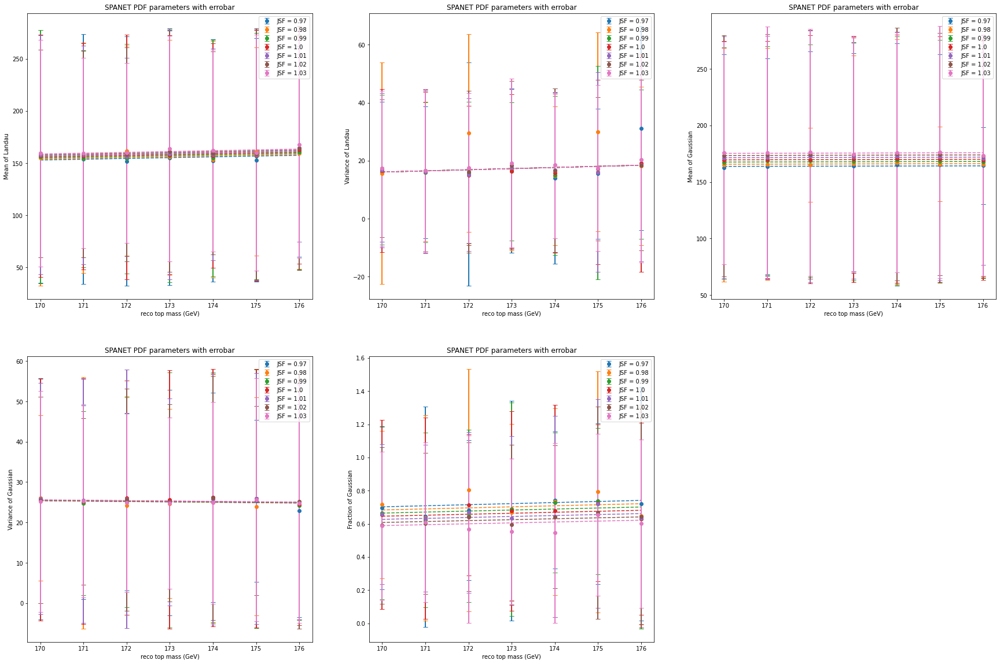

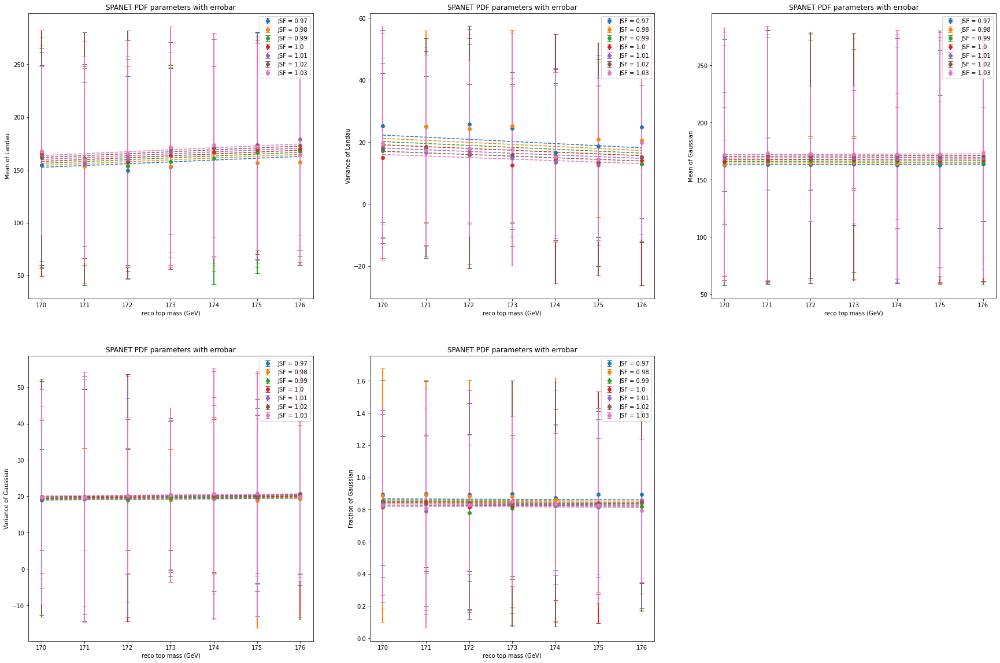

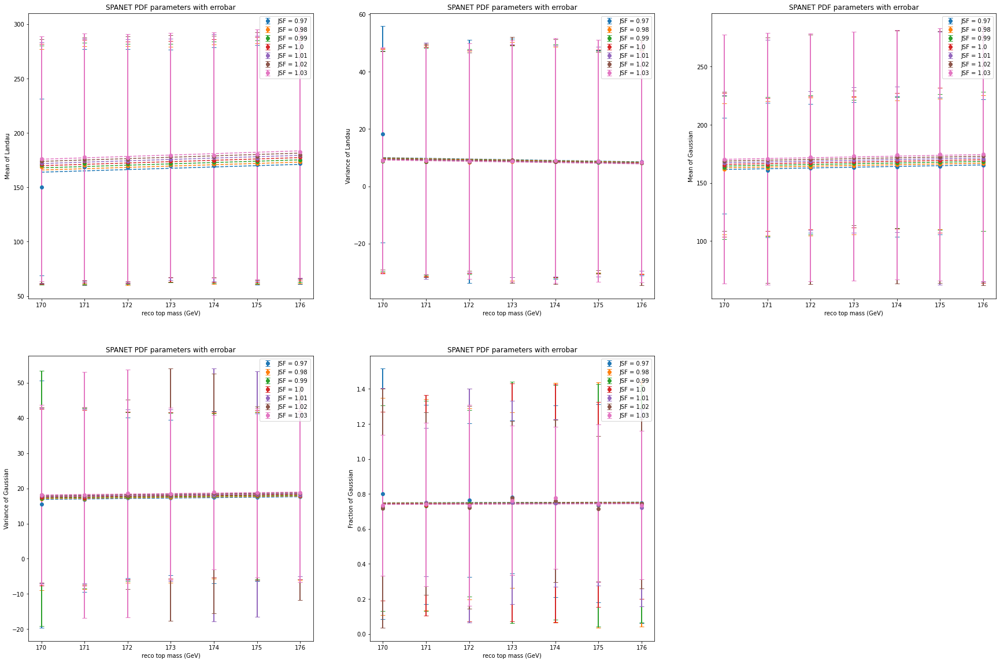

In [18]:
pdf_spanet_dic = defaultdict(list)
for state_i in [0, 1, 2]:
    plt.figure(figsize=(30, 20))
    for i in range(5):
        plt.subplot(2, 3, i+1)
        popt, pcov = optimize.curve_fit(linear_linear, np.transpose(list(fit_popt_dic[state_i].keys())), [fit_popt_dic[state_i][key][i] for key in fit_popt_dic[state_i]], sigma = [fit_perr_dic[state_i][key][i] for key in fit_popt_dic[state_i]], method="lm")
        pdf_spanet_dic[(state_i, i)] = popt
        
        for j, JSF in enumerate(JSF_arr):
            plt.errorbar(mass, [fit_popt_dic[state_i][(m, JSF)][i] for m in mass], yerr=[fit_perr_dic[state_i][(m, JSF)][i] for m in mass], fmt='o', elinewidth=2, capsize=4, label='JSF = {}'.format(JSF), c=colors[j])
            plt.plot(top_mass_dense, linear_linear([top_mass_dense, np.array([JSF]*1000)], *popt), '--', c=colors[j])
        plt.legend(loc='upper right')
        plt.title('SPANET PDF parameters with errobar')
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel(langau_fit_labels[i])
    plt.show()

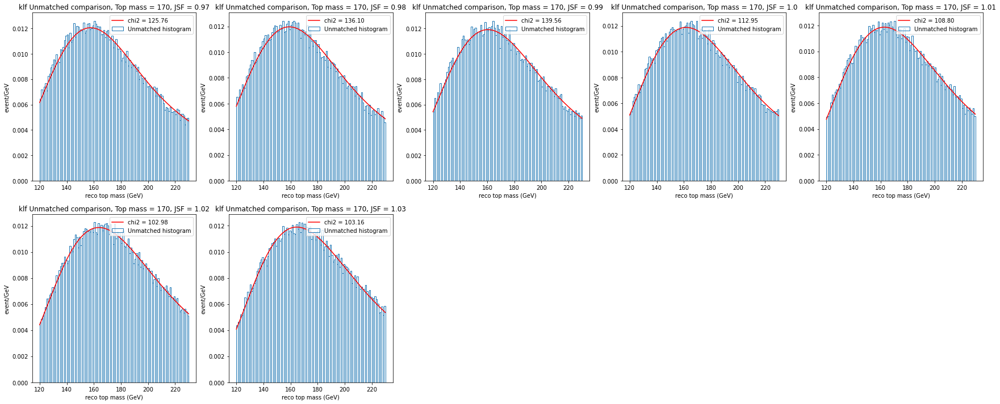

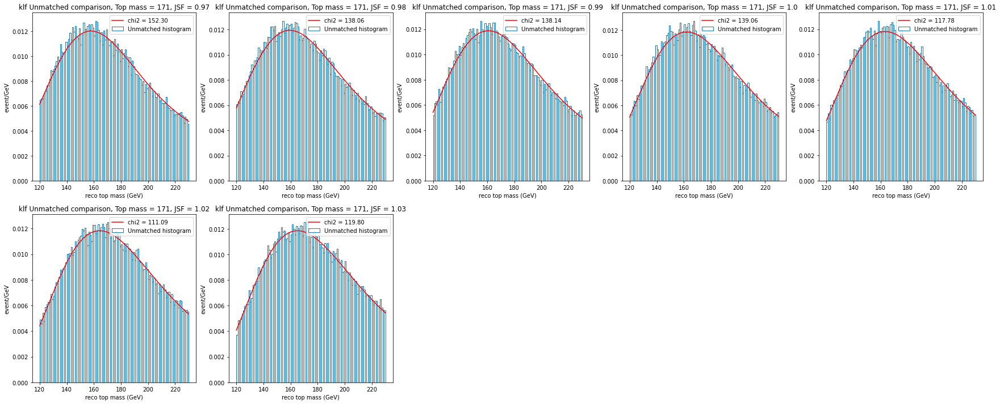

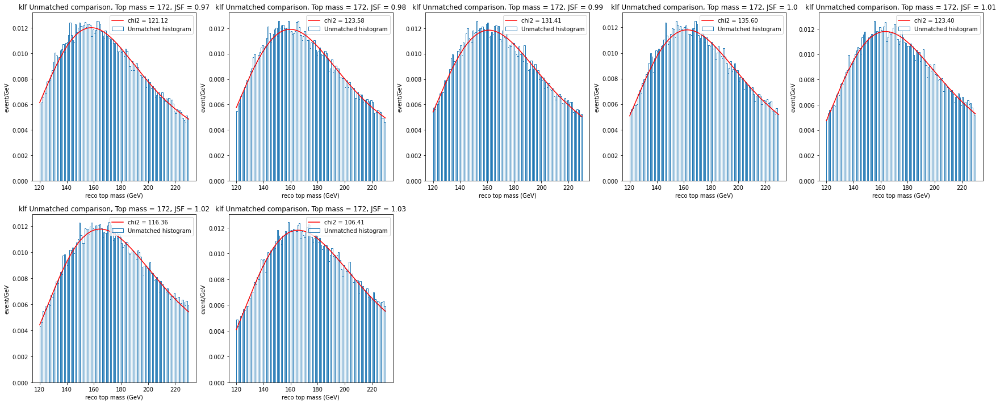

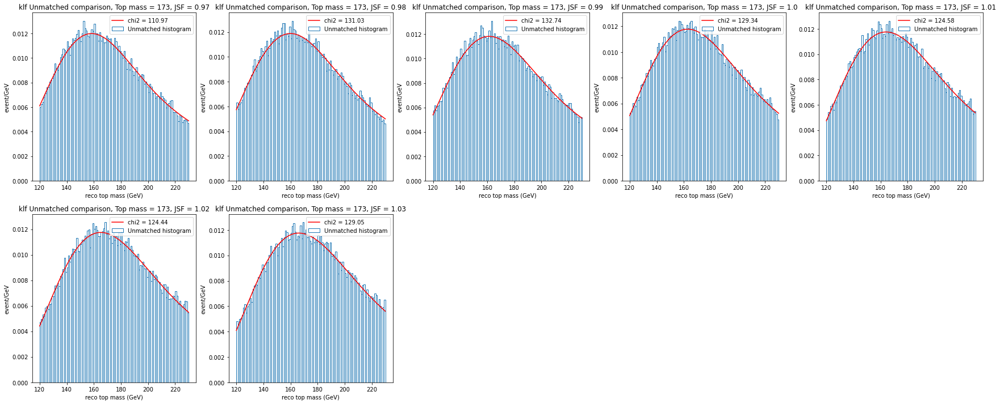

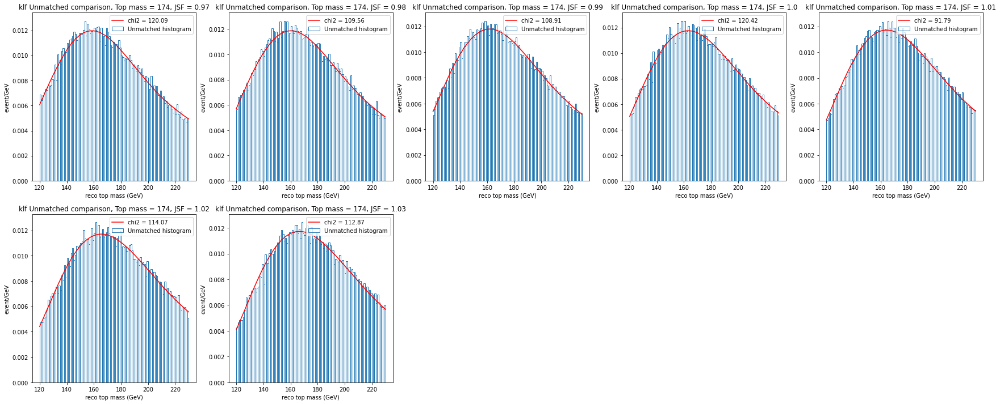

...

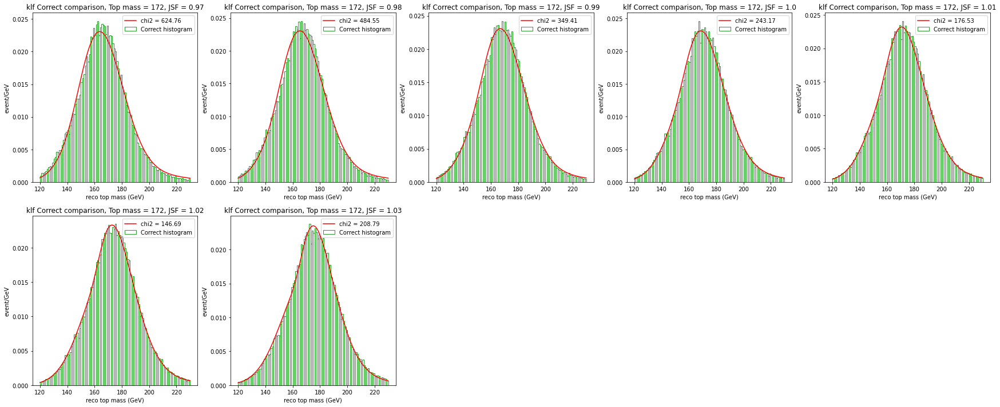

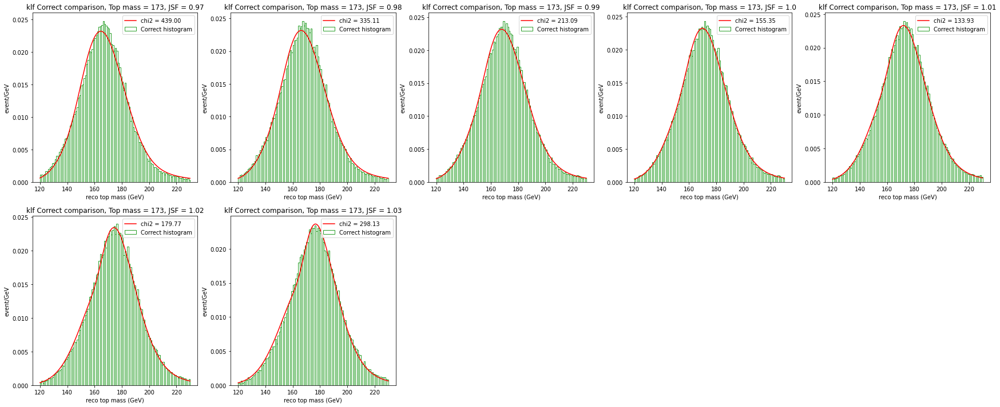

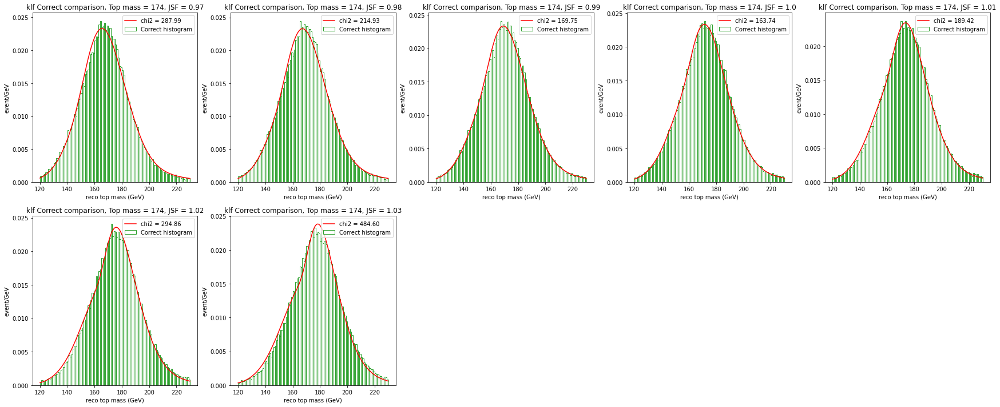

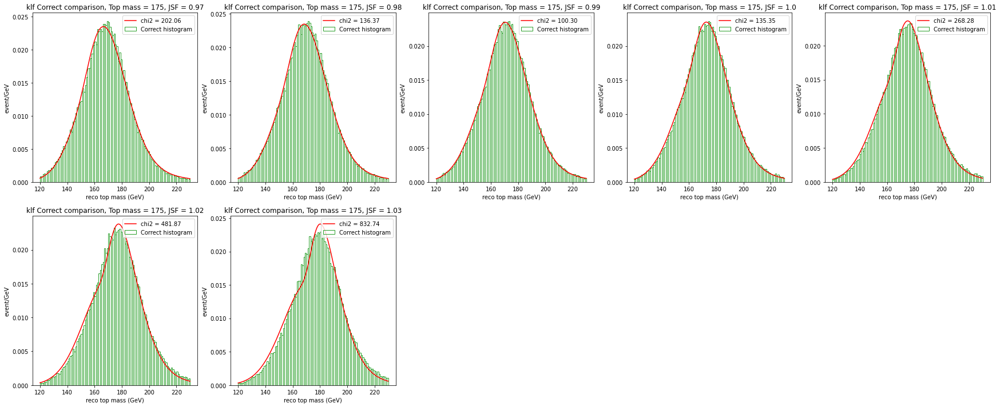

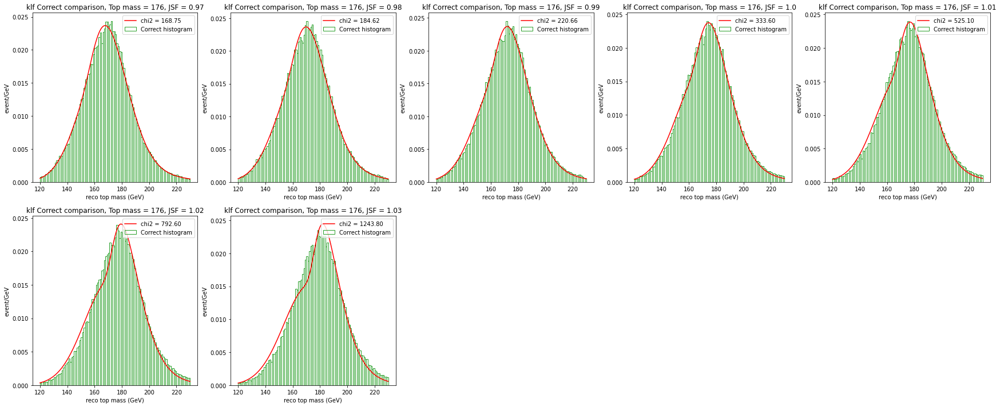

In [20]:
# Compare the klfitter pdf to the original template
for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=plt_fig)
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(plt_xn, plt_yn, i+1)
            fit_target = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], state_klf_dic[(m, JSF)] == state_i, likeli_klf_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_klf_dic[(state_i, j)]) for j in range(5)]
            plt.bar(bins_mid, hist, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(bins_dense, langau_norm(bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf(fit_target, langau_norm(bins_mid, *popt))))
            plt.title('klf {} comparison, Top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

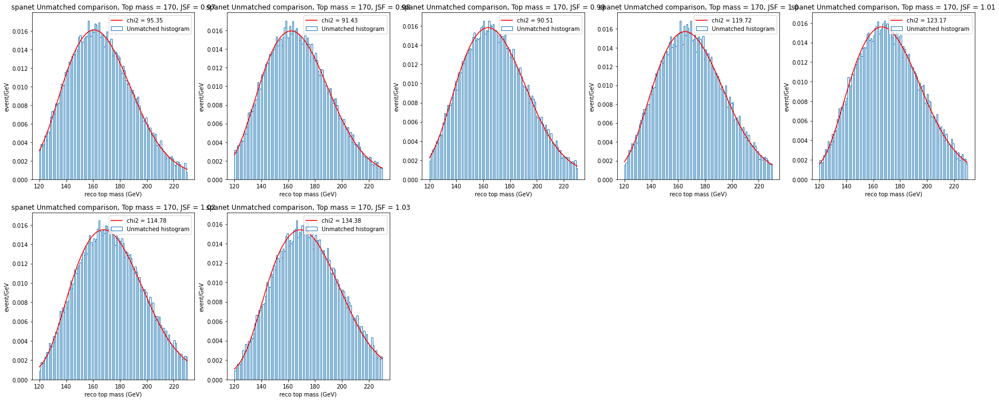

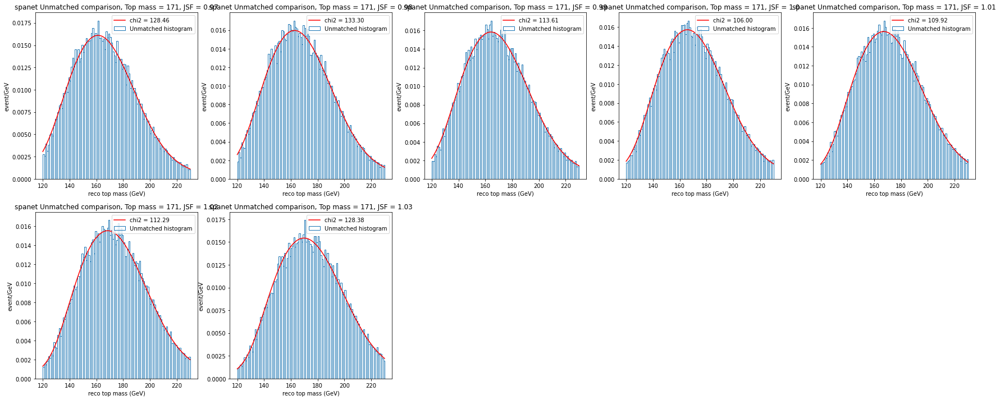

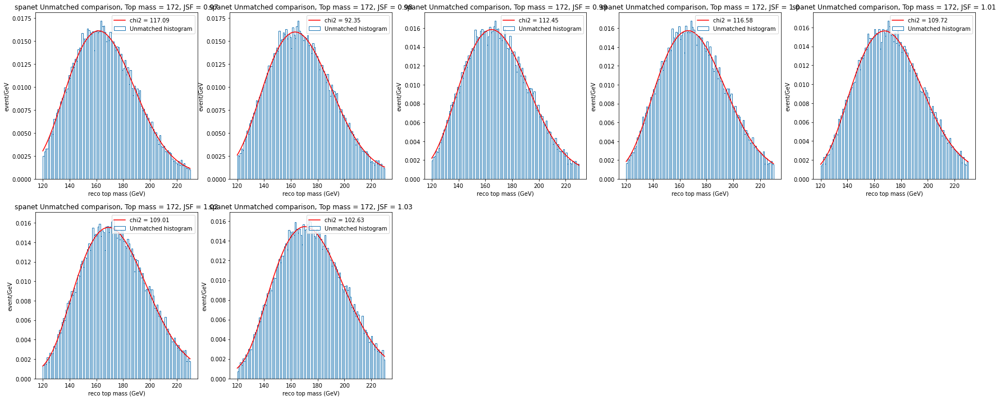

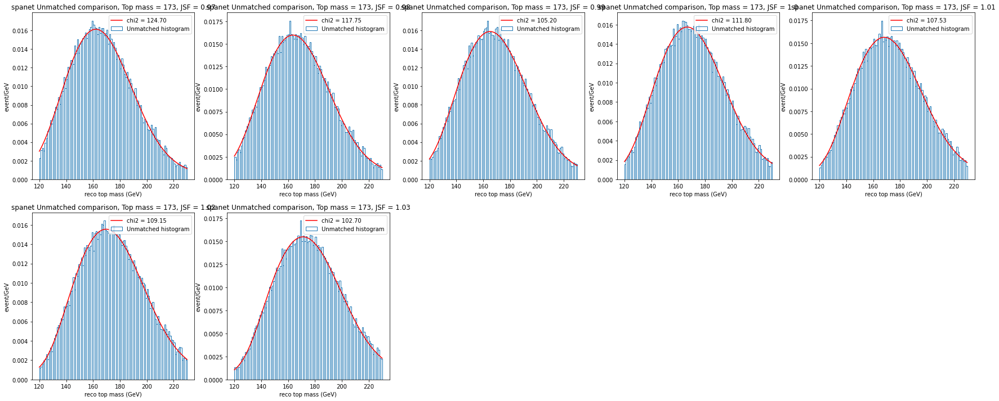

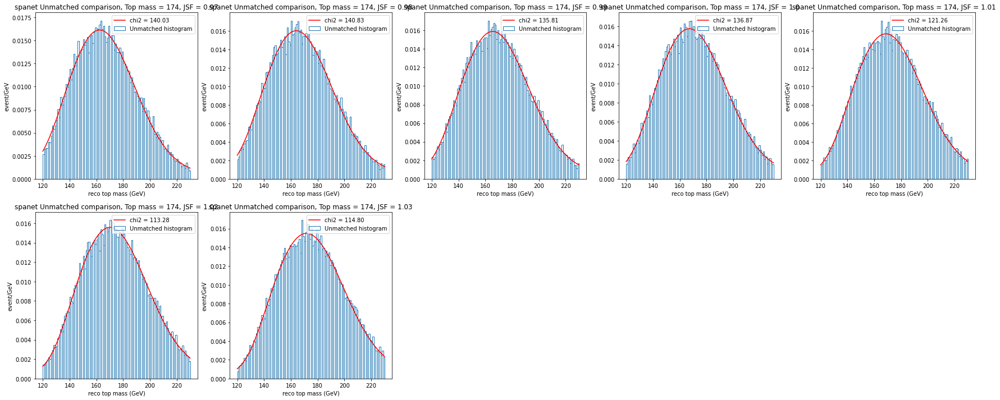

...

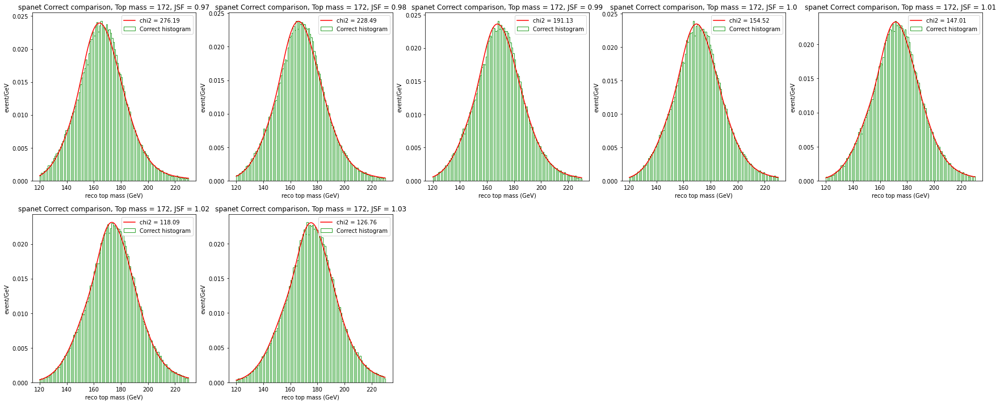

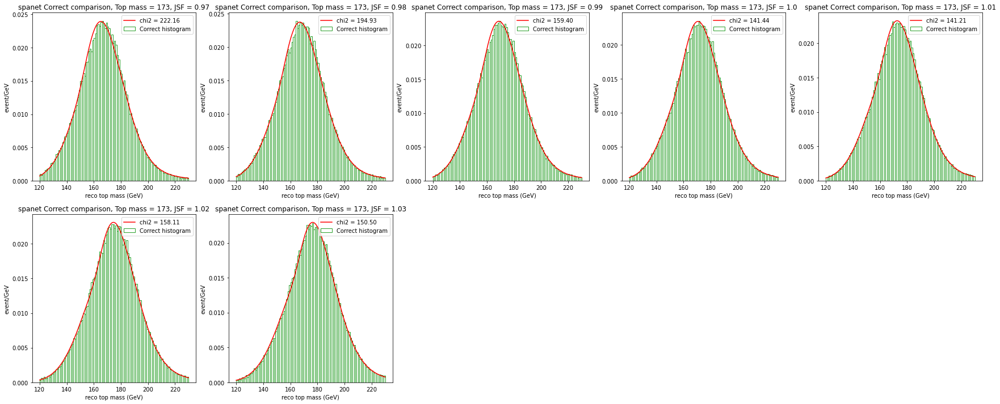

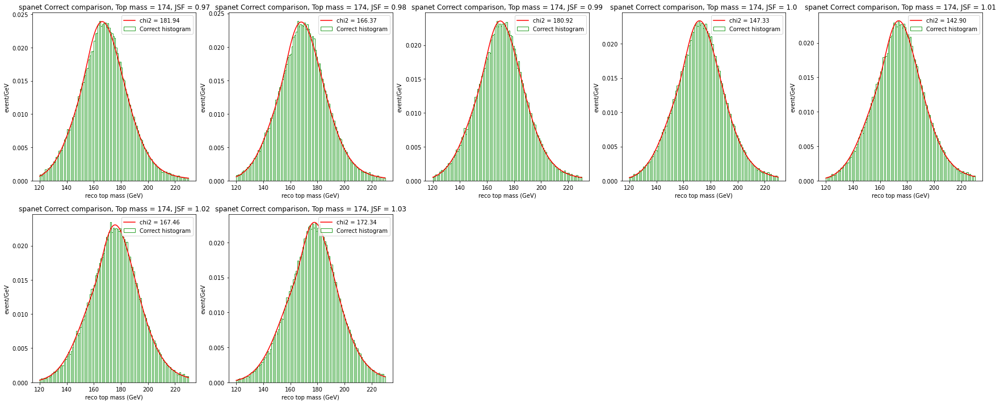

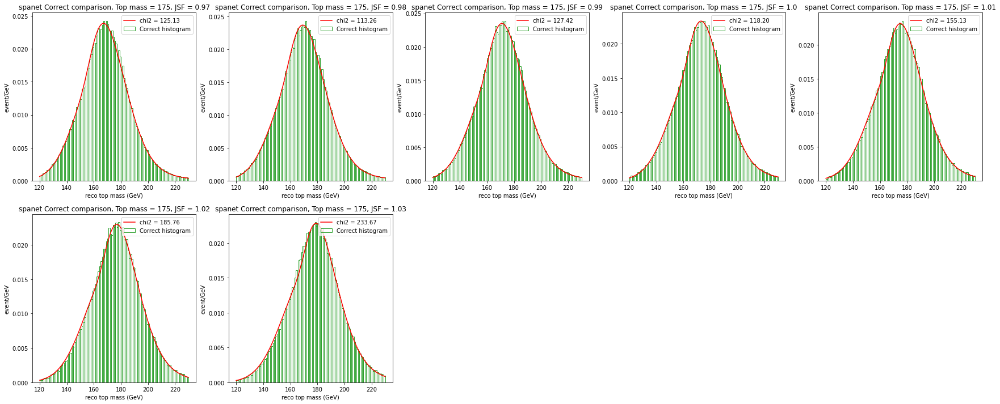

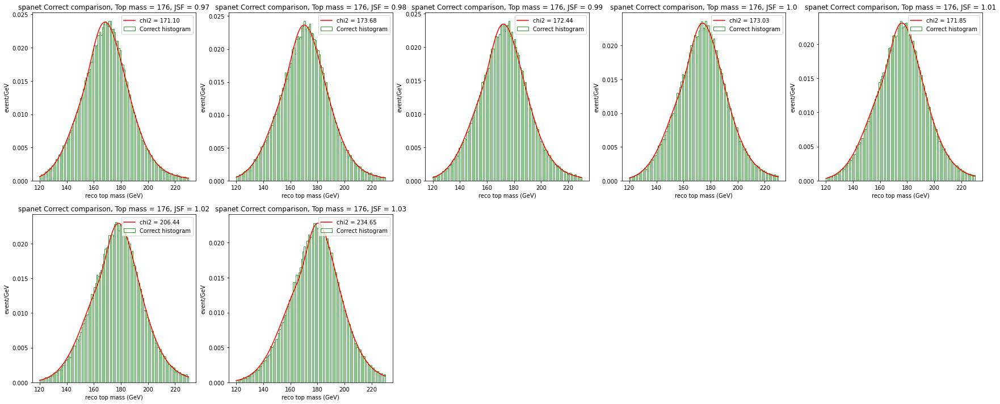

In [22]:
# Compare the spanet pdf to the original histogram
for state_i in [0, 1, 2]:
    for m in mass:
        plt.figure(figsize=plt_fig)
        for i, JSF in enumerate(JSF_arr):
            plt.subplot(plt_xn, plt_yn, i+1)
            fit_target = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], state_spanet_dic[(m, JSF)] == state_i, likeli_spanet_dic[(m, JSF)]))]
            hist, _ = np.histogram(fit_target, bins=bins, density=True)
            popt = [linear_linear((m, JSF), *pdf_spanet_dic[(state_i, j)]) for j in range(5)]
            plt.bar(bins_mid, hist, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
            plt.plot(bins_dense, langau_norm(bins_dense, *popt), c='r', label='chi2 = {:.2f}'.format(chi2_pdf(fit_target, langau_norm(bins_mid, *popt))))
            plt.title('spanet {} comparison, Top mass = {}, JSF = {}'.format(state_labels[state_i], m, JSF))
            plt.xlabel('reco top mass (GeV)')
            plt.ylabel('event/GeV')
            plt.legend(loc = 'upper right')
        plt.show()

In [23]:
def combine_klf_pdf_func(x, m, JSF):
    hist = [0]*len(x)
    for state_i in [0, 1, 2]:
        popt = [linear_linear((m, JSF), *pdf_klf_dic[(state_i, j)]) for j in range(5)]
        hist += langau_norm(x, *popt)*linear_parabola([m, JSF], *fpdf_klf_popt[state_i])
    return hist

def combine_spanet_pdf_func(x, m, JSF):
    hist = [0]*len(x)
    for state_i in [0, 1, 2]:
        popt = [linear_linear((m, JSF), *pdf_spanet_dic[(state_i, j)]) for j in range(5)]
        hist += langau_norm(x, *popt)*linear_parabola([m, JSF], *fpdf_spanet_popt[state_i])
    return hist

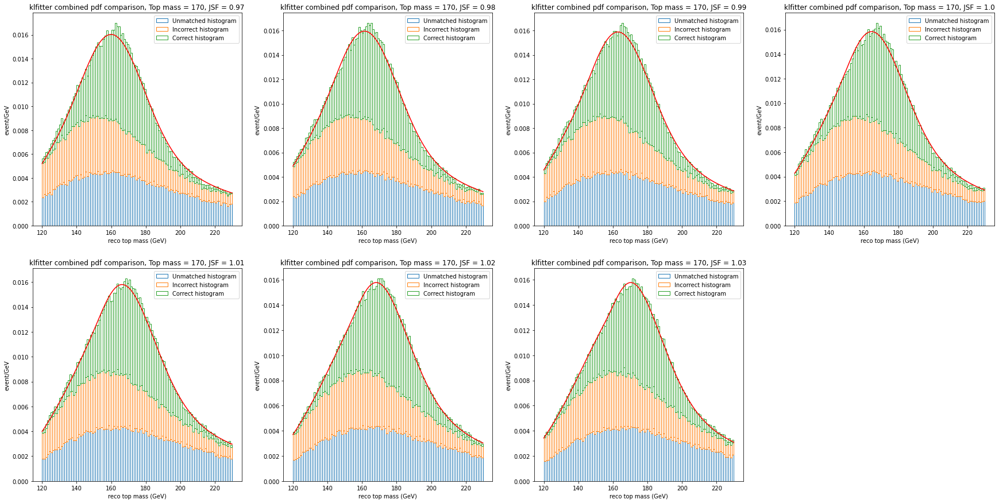

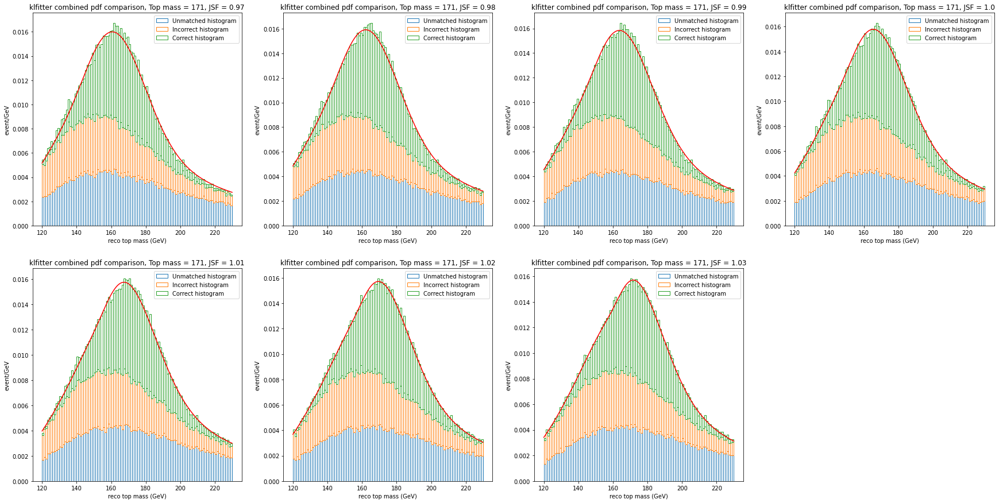

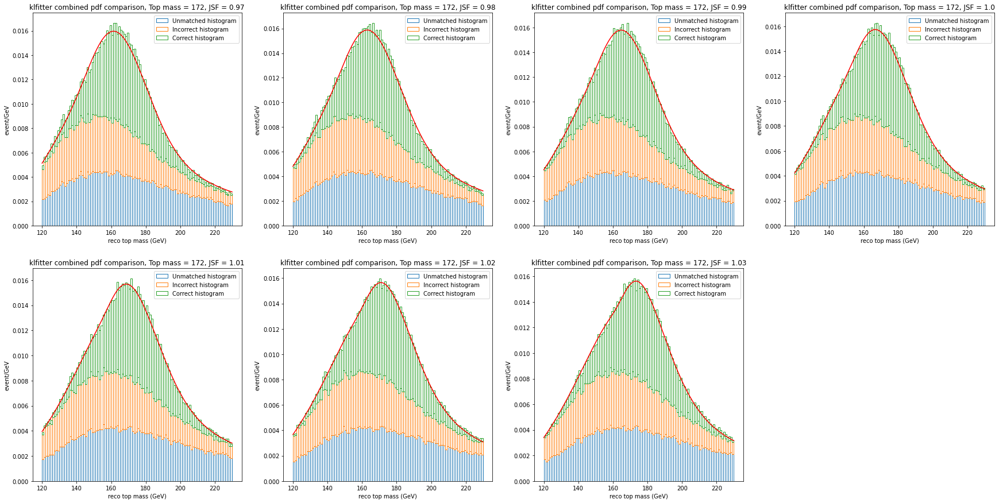

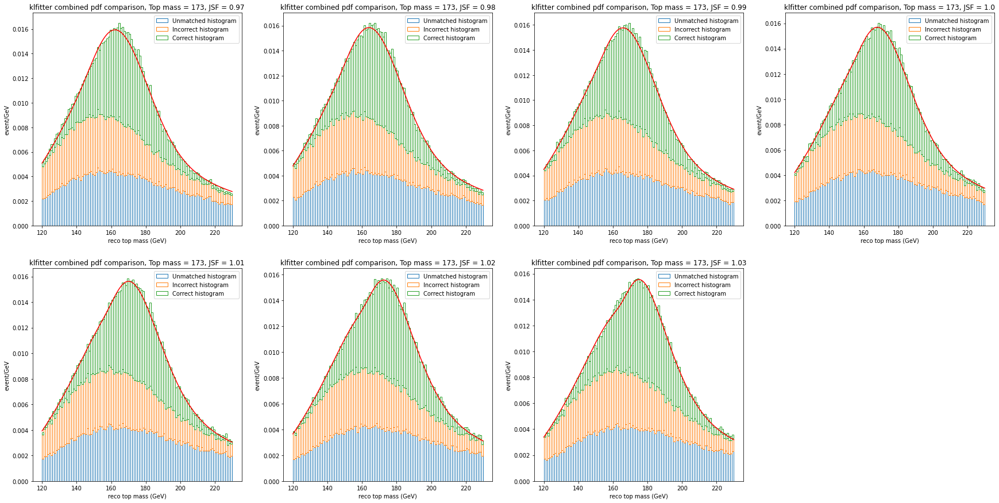

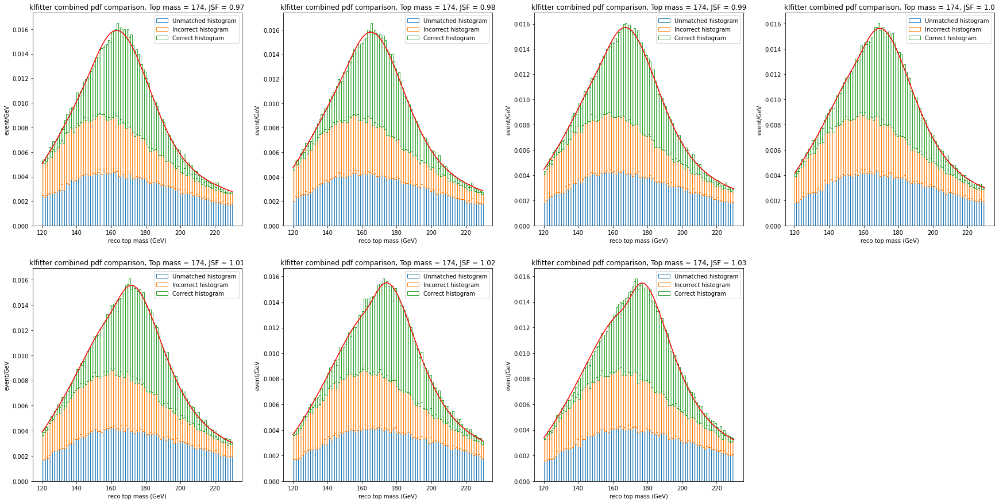

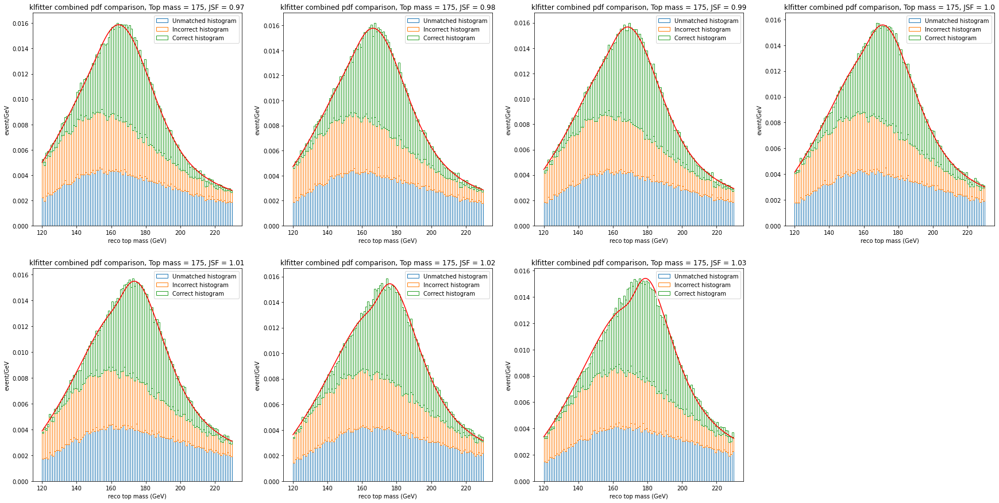

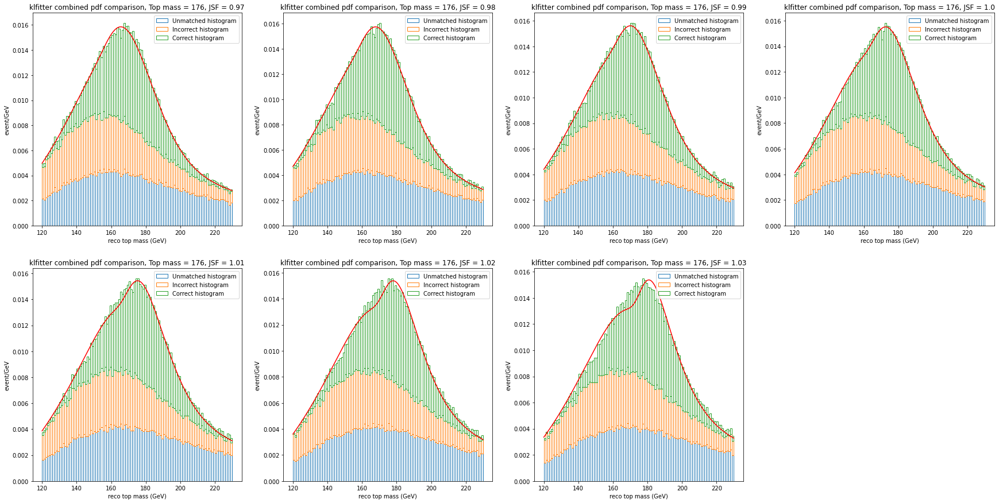

In [25]:
# Compare the klfitter pdf to the original histogram
for m in mass:
    plt.figure(figsize=(30, 15))
    for i, JSF in enumerate(JSF_arr):
        plt.subplot(2, 4, i+1)
        fit_target = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]        
        h, tot = [0]*(len(bins)-1), len(fit_target)
        for state_i in [0, 1, 2]:
            hist, _ = np.histogram(reco_klf_dic[(m, JSF)][np.logical_and.reduce((state_klf_dic[(m, JSF)] == state_i, cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))], bins=bins)
            plt.bar(bins_mid, hist/tot/bins_w, bottom=h, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
            h += hist/tot/bins_w

        plt.plot(bins_dense, combine_klf_pdf_func(bins_dense, m, JSF), c='r')
        plt.title('klfitter combined pdf comparison, Top mass = {}, JSF = {}'.format(m, JSF))
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel('event/GeV')
        plt.legend(loc='upper right')
    plt.show()

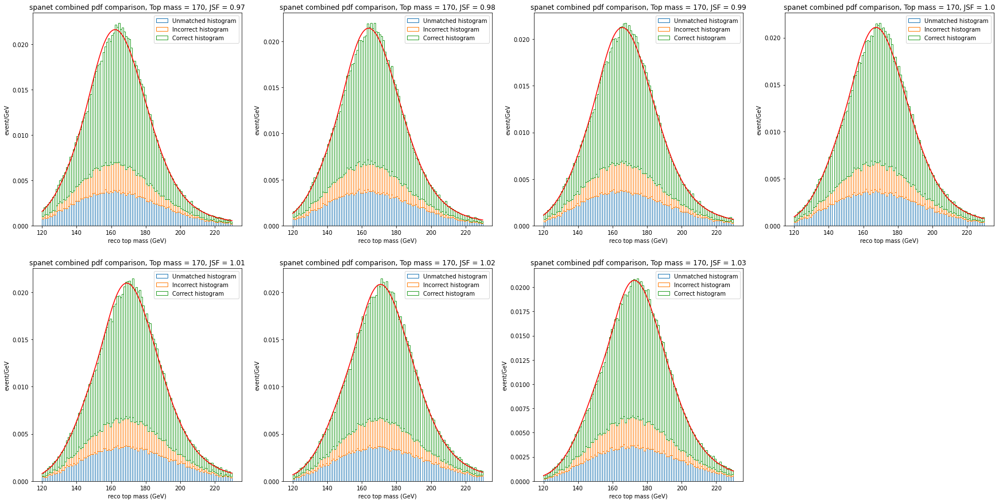

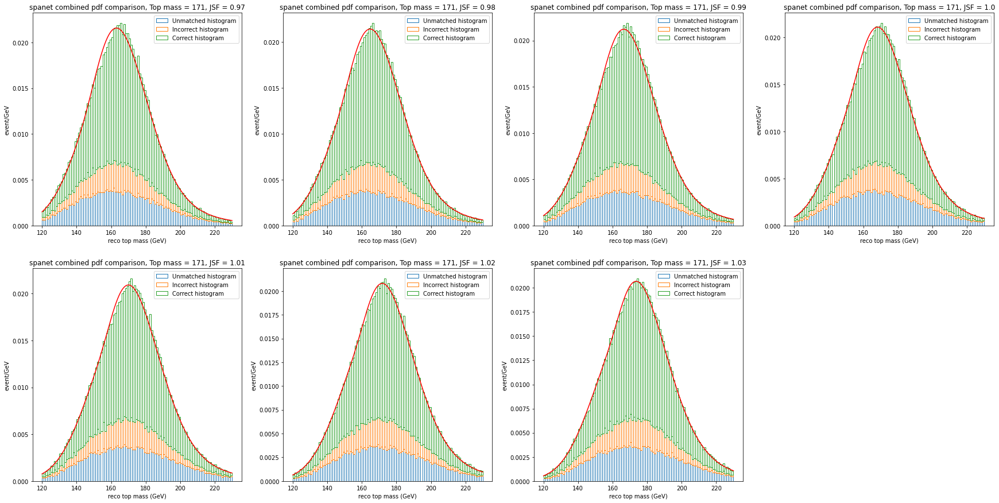

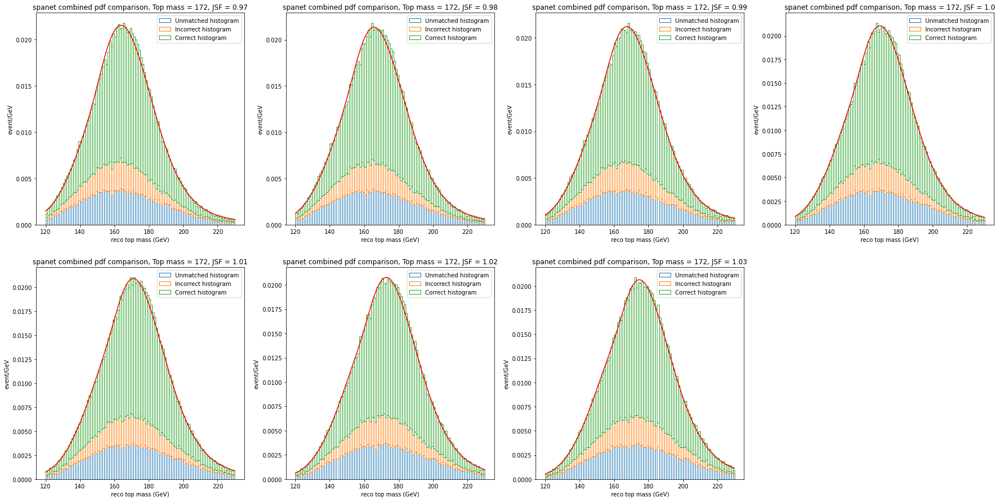

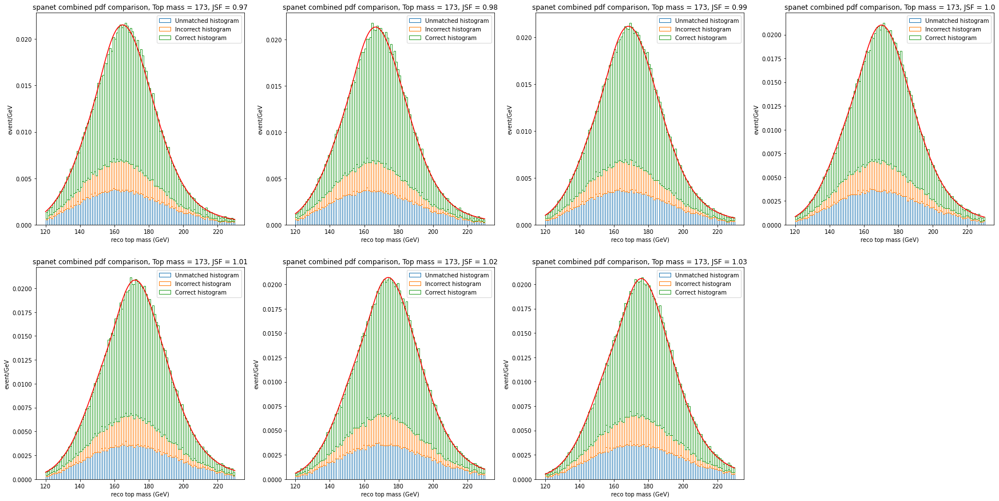

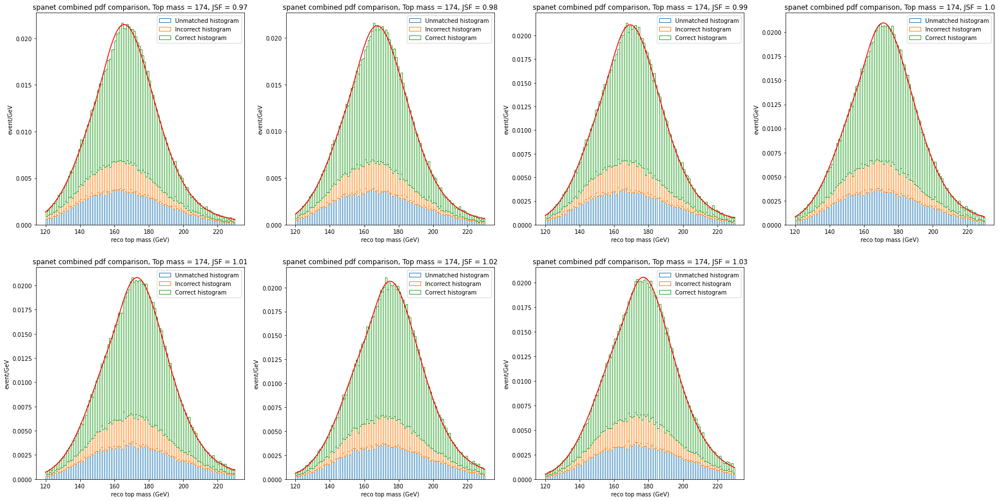

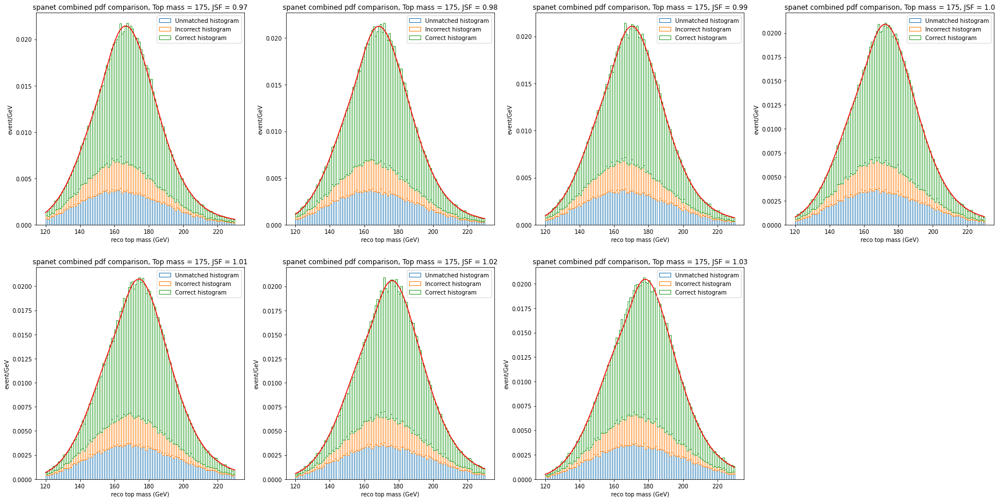

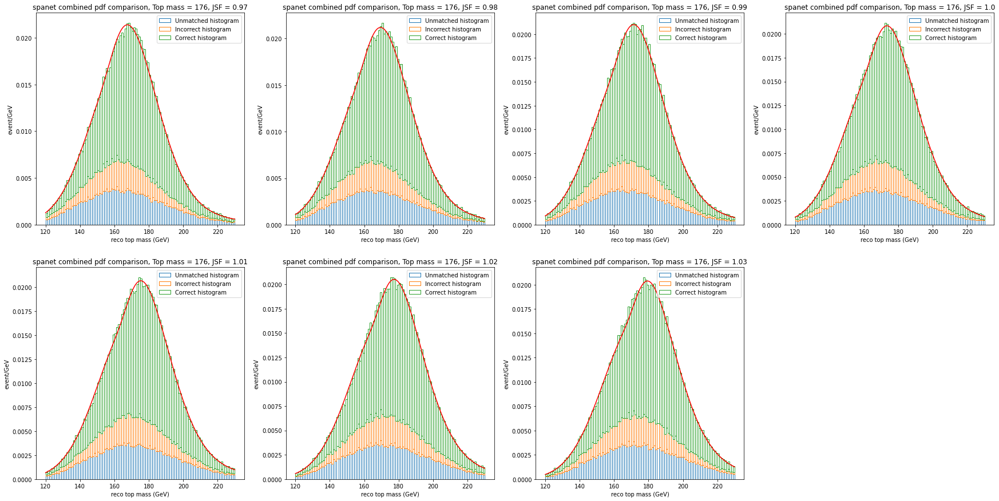

In [26]:
# Compare the spanet pdf to the original histogram
for m in mass:
    plt.figure(figsize=(30, 15))
    for i, JSF in enumerate(JSF_arr):
        plt.subplot(2, 4, i+1)
        fit_target = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
        h, tot = [0]*(len(bins)-1), len(fit_target)
        for state_i in [0, 1, 2]:
            hist, _ = np.histogram(reco_spanet_dic[(m, JSF)][np.logical_and.reduce((state_spanet_dic[(m, JSF)] == state_i, cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))], bins=bins)
            plt.bar(bins_mid, hist/tot/bins_w, bottom=h, edgecolor=colors[state_i], width=bins_w, color='None', label = state_labels[state_i] + ' histogram')
            h += hist/tot/bins_w

        plt.plot(bins_dense, combine_spanet_pdf_func(bins_dense, m, JSF), c='r')
        plt.title('spanet combined pdf comparison, Top mass = {}, JSF = {}'.format(m, JSF))
        plt.xlabel('reco top mass (GeV)')
        plt.ylabel('event/GeV')
        plt.legend(loc='upper right')
    plt.show()

In [27]:
def chi2_klf_arr_func(m, JSF):
    return -2*np.sum(n1*np.log(combine_klf_pdf_func(bins_mid, m, JSF)*sum(n1)*bins_w)) + sum(n1)

def chi2_spanet_arr_func(m, JSF):
    return -2*np.sum(n1*np.log(combine_spanet_pdf_func(bins_mid, m, JSF)*sum(n1)*bins_w)) + sum(n1)

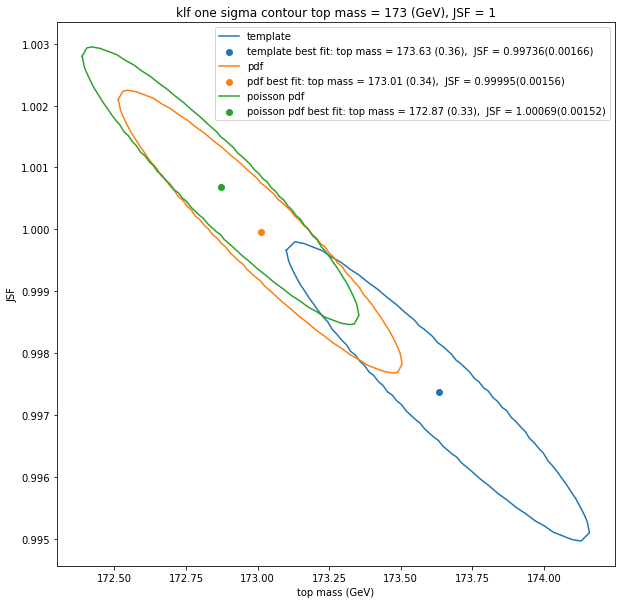

In [34]:
m, JSF = 173, 1
plt.figure(figsize=(10, 10))
reco_klf = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n1 = np.histogram(reco_klf, bins=bins)[0]
minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 100)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='template')
plt.scatter(minuit.values[0], minuit.values[1], label='template best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

n1 = combine_klf_pdf_func(bins_mid, m, JSF)*len(reco_klf)*bins_w
minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 100)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='pdf')
plt.scatter(minuit.values[0], minuit.values[1], label='pdf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

n1 = np.random.poisson(n1)
minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 100)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='poisson pdf')
plt.scatter(minuit.values[0], minuit.values[1], label='poisson pdf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))


plt.title('klf one sigma contour top mass = {} (GeV), JSF = {}'.format(m, JSF))
plt.xlabel('top mass (GeV)')
plt.ylabel('JSF')
plt.legend()
plt.show()

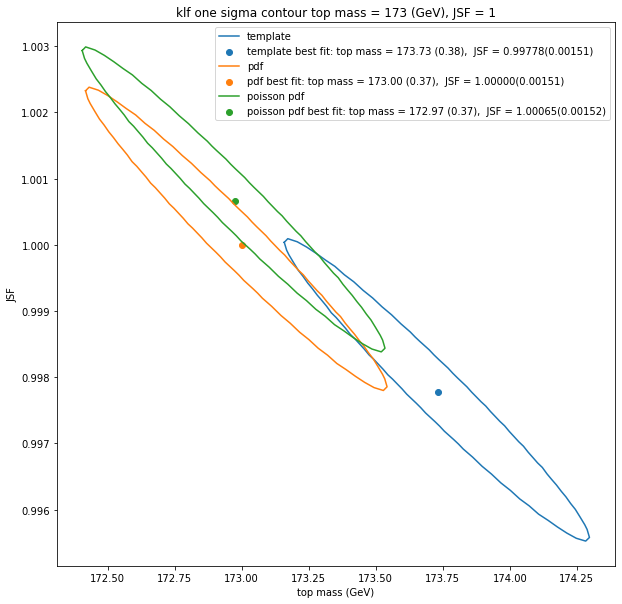

In [29]:
m, JSF = 173, 1
plt.figure(figsize=(10, 10))
reco_spanet = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n1 = np.histogram(reco_spanet, bins=bins)[0]
minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 100)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='template')
plt.scatter(minuit.values[0], minuit.values[1], label='template best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

n1 = combine_spanet_pdf_func(bins_mid, m, JSF)*len(reco_spanet)*bins_w
minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 100)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='pdf')
plt.scatter(minuit.values[0], minuit.values[1], label='pdf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))

n1 = np.random.poisson(n1)
minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 100)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='poisson pdf')
plt.scatter(minuit.values[0], minuit.values[1], label='poisson pdf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))


plt.title('klf one sigma contour top mass = {} (GeV), JSF = {}'.format(m, JSF))
plt.xlabel('top mass (GeV)')
plt.ylabel('JSF')
plt.legend()
plt.show()

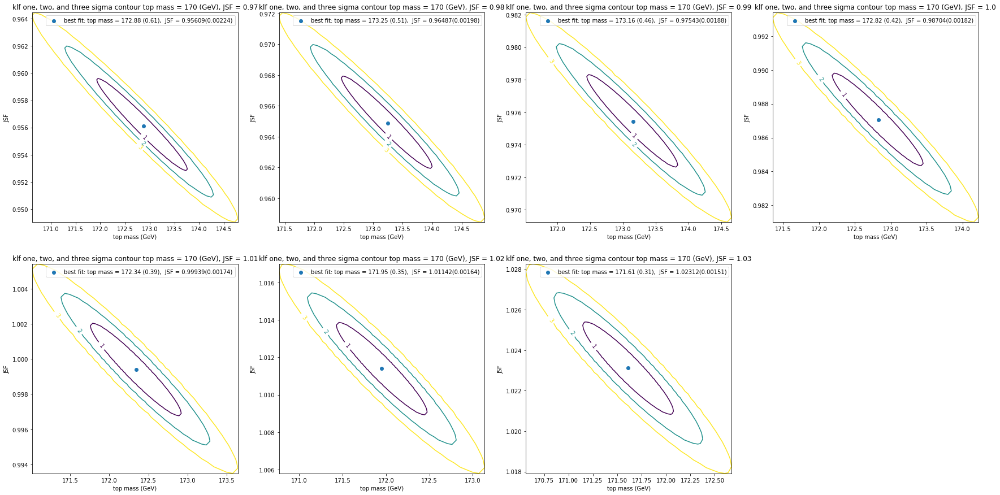

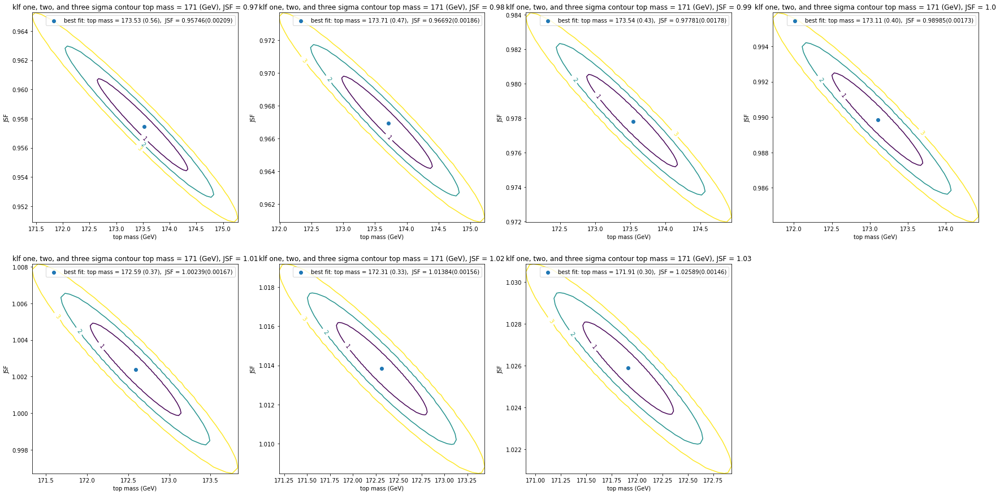

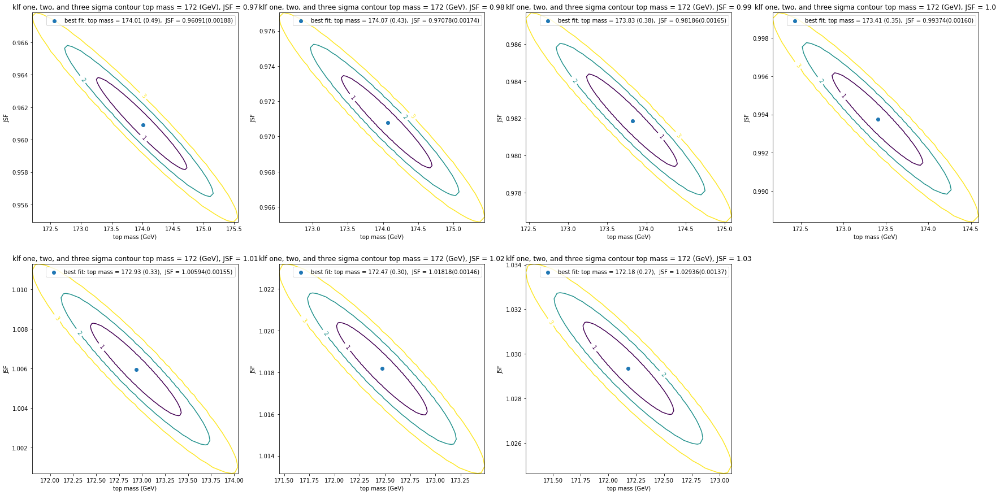

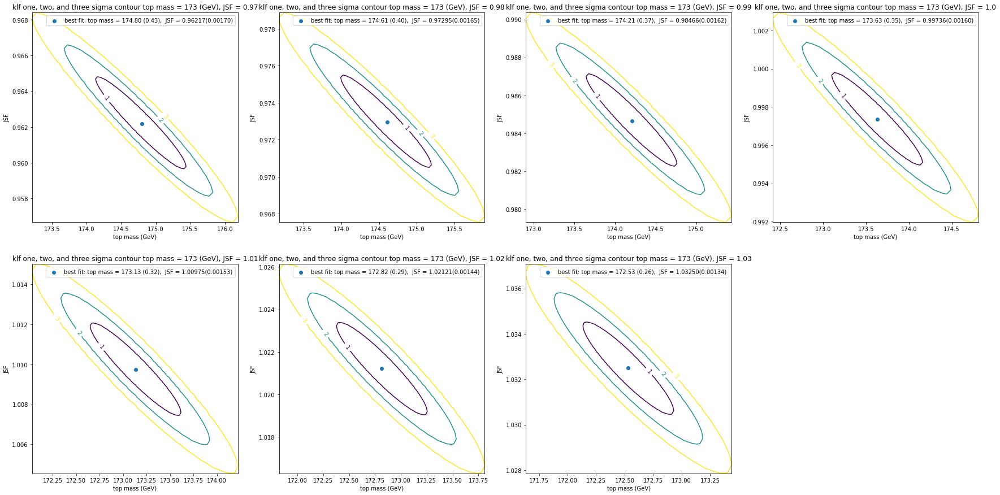

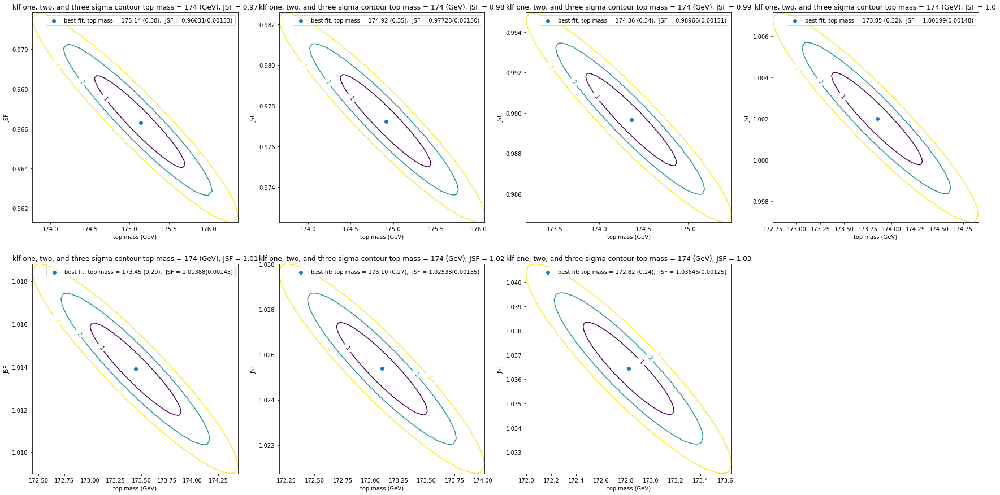

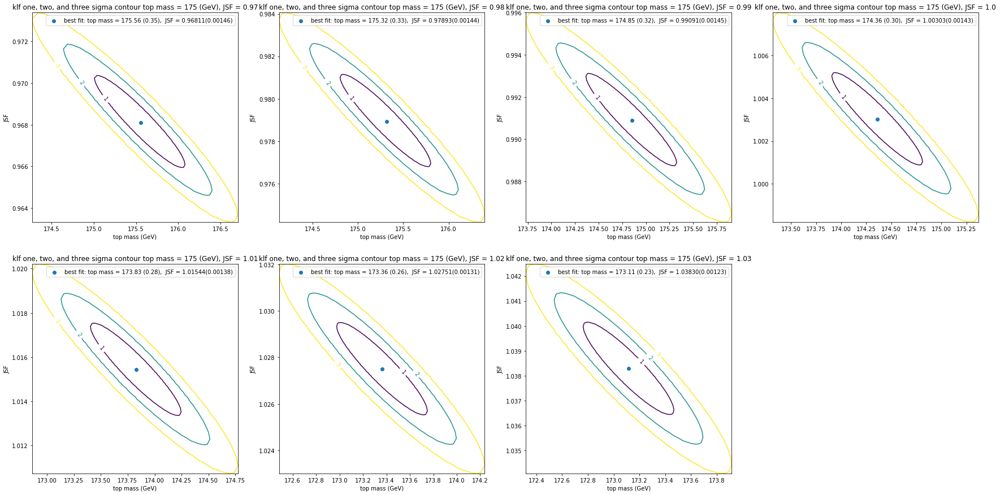

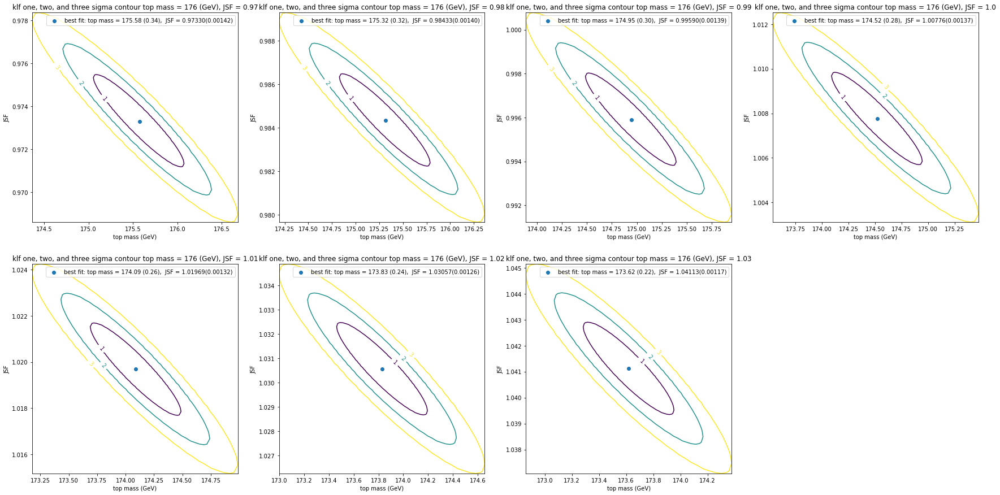

In [33]:
for m in mass:
    plt.figure(figsize=(30, 15))
    for i, JSF in enumerate(JSF_arr):
        plt.subplot(2, 4, i+1)
        reco_klf = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
        n1 = np.histogram(reco_klf, bins=bins)[0]
        minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
        minuit.migrad()
        minuit.minos()
        minuit.draw_mncontour("m", "JSF", cl=[1, 2, 3], size = 100)
        plt.scatter(minuit.values[0], minuit.values[1], label='best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))
        plt.title('klf one, two, and three sigma contour top mass = {} (GeV), JSF = {}'.format(m, JSF))
        plt.xlabel('top mass (GeV)')
        plt.ylabel('JSF')
        plt.legend()
    plt.show()

In [ ]:
for m in mass:
    plt.figure(figsize=(30, 10))
    for i, JSF in enumerate(JSF_arr):
        plt.subplot(1, 3, i+1)
        reco_spanet = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
        n1 = np.histogram(reco_spanet, bins=bins)[0]
        minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
        minuit.migrad()
        minuit.minos()
        minuit.draw_mncontour("m", "JSF", cl=[1, 2, 3], size = 100)
        plt.scatter(minuit.values[0], minuit.values[1], label='best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))
        plt.title('spanet one, two, and three sigma contour top mass = {} (GeV), JSF = {}'.format(m, JSF))
        plt.xlabel('top mass (GeV)')
        plt.ylabel('JSF')
        plt.legend()
    plt.show()

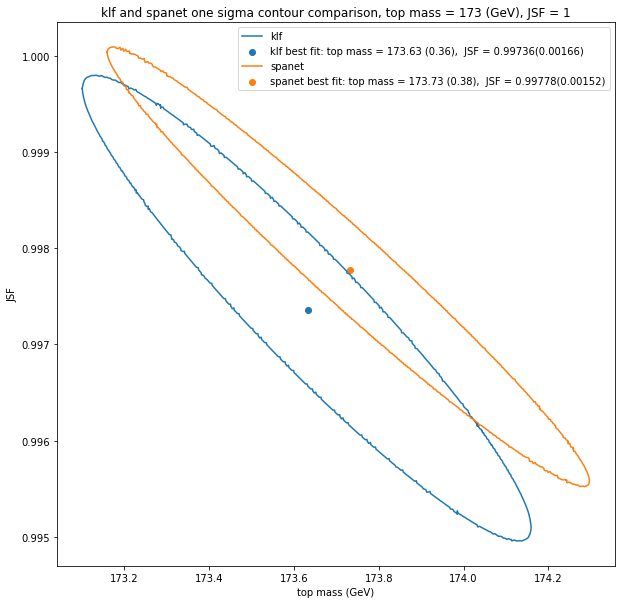

In [55]:
plt.figure(figsize=(10, 10))
m, JSF = 173, 1
reco_klf = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
n1 = np.histogram(reco_klf, bins=bins)[0]
minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='klf')
plt.scatter(minuit.values[0], minuit.values[1], label='klf best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))
minuit
reco_spanet = reco_spanet_dic[(m, JSF)][np.logical_and.reduce((cut_spanet_dic[(m, JSF)], likeli_spanet_dic[(m, JSF)]))]
n1 = np.histogram(reco_spanet, bins=bins)[0]
minuit = Minuit(chi2_spanet_arr_func, m=m, JSF=JSF)
minuit.migrad()
minuit.minos()
pts = minuit.mncontour("m", "JSF", cl=1, size = 1000)
x, y = np.transpose(pts)
plt.plot(x, y, '-', label='spanet')
plt.scatter(minuit.values[0], minuit.values[1], label='spanet best fit: top mass = {:.2f} ({:.2f}),  JSF = {:.5f}({:.5f})'.format(minuit.values[0], minuit.errors[0],  minuit.values[1], minuit.errors[1]))
minuit
plt.title('klf and spanet one sigma contour comparison, top mass = {} (GeV), JSF = {}'.format(m, JSF))
plt.xlabel('top mass (GeV)')
plt.ylabel('JSF')
plt.legend(loc = 'upper right')
plt.show()

In [47]:
#Sudo experiment for KLFitter top mass
sudo_klf_top_mean_dic = {}
sudo_klf_top_std_dic = {}
sudo_klf_JSF_mean_dic = {}
sudo_klf_JSF_std_dic = {}

JSF = 1
for m in mass:
    reco_klf = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
    sudo_klf = np.histogram(reco_klf, bins=bins)[0]
    n1_arr = np.random.poisson(sudo_klf, size=(sudo_event, (bins_max-bins_min)//bins_w))
    mean, std = [], []
    for i in range(sudo_event):
        n1 = n1_arr[i]
        minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
        minuit.limits = [[166, 180],[0.94,1.07]]
        minuit.migrad()
        minuit.minos()
        mean.append(list(minuit.values))
        std.append(list(minuit.errors))
    top_mean, JSF_mean = np.transpose(mean)
    top_std, JSF_std = np.transpose(std)
    sudo_klf_top_mean_dic[(m, JSF)] = top_mean
    sudo_klf_top_std_dic[(m, JSF)] = top_std
    sudo_klf_JSF_mean_dic[(m, JSF)] = JSF_mean
    sudo_klf_JSF_std_dic[(m, JSF)] = JSF_std

m = 173
for JSF in JSF_arr:
    reco_klf = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
    sudo_klf = np.histogram(reco_klf, bins=bins)[0]
    n1_arr = np.random.poisson(sudo_klf, size=(sudo_event, (bins_max-bins_min)//bins_w))
    mean, std = [], []
    for i in range(sudo_event):
        n1 = n1_arr[i]
        minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
        minuit.limits = [[166, 180],[0.94,1.07]]
        minuit.migrad()
        minuit.minos()
        mean.append(list(minuit.values))
        std.append(list(minuit.errors))
    top_mean, JSF_mean = np.transpose(mean)
    top_std, JSF_std = np.transpose(std)
    sudo_klf_top_mean_dic[(m, JSF)] = top_mean
    sudo_klf_top_std_dic[(m, JSF)] = top_std
    sudo_klf_JSF_mean_dic[(m, JSF)] = JSF_mean
    sudo_klf_JSF_std_dic[(m, JSF)] = JSF_std

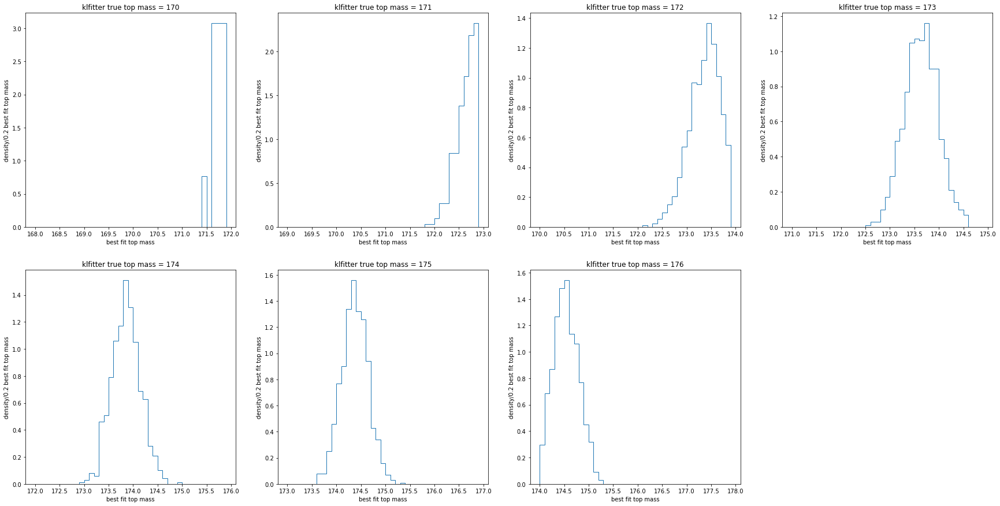

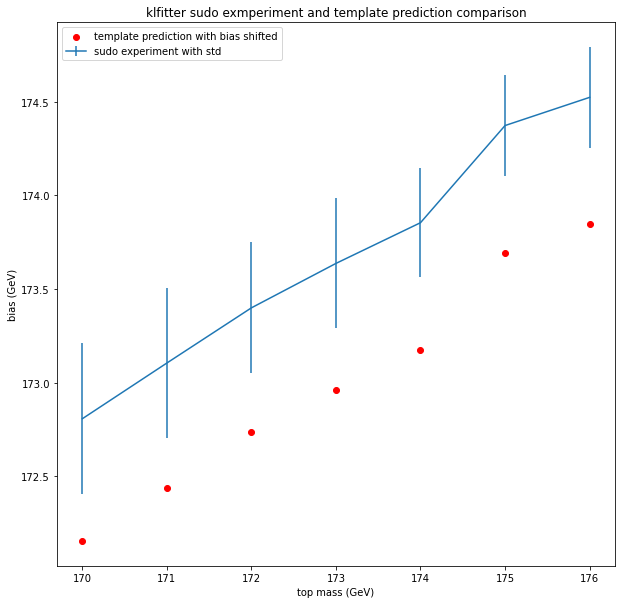

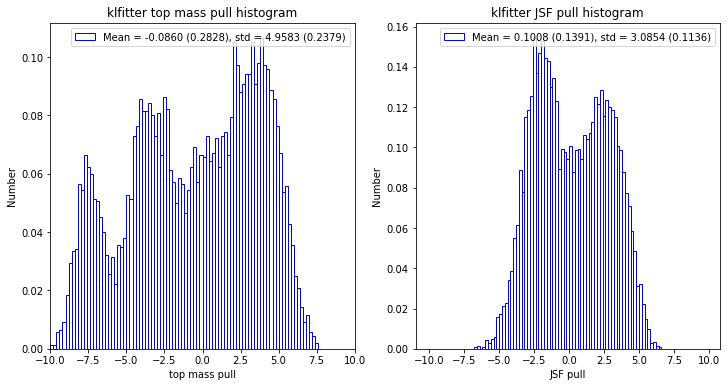

In [54]:
plt.figure(figsize=(30,15))
for i, m in enumerate(mass):
    plt.subplot(2, 4, i+1)
    bins_top = np.arange(m-2, m+2, 0.1)
    plt.hist(sudo_klf_top_mean_dic[(m, 1)], bins=bins_top, density=True, histtype='step')
    plt.title('klfitter true top mass = {}'.format(m))
    plt.xlabel('best fit top mass')
    plt.ylabel('density/0.2 best fit top mass')
plt.show()

plt.figure(figsize=(10, 10))
JSF = 1
plt.errorbar(mass, [np.mean(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass], yerr=[np.std(sudo_klf_top_mean_dic[(m, JSF)]) for m in mass], label='sudo experiment with std')

template_klf_mass = []
for m in mass:
    reco_klf = reco_klf_dic[(m, JSF)][np.logical_and.reduce((cut_klf_dic[(m, JSF)], likeli_klf_dic[(m, JSF)]))]
    n1 = np.histogram(reco_klf, bins=bins)[0]
    minuit = Minuit(chi2_klf_arr_func, m=m, JSF=JSF)
    minuit.migrad()
    minuit.hesse()
    template_klf_mass.append(minuit.values[0])
klf_mass_bias = np.mean([template_klf_mass[i] - m for i, m in enumerate(mass)])
plt.scatter(mass, template_klf_mass - klf_mass_bias, c='r', label='template prediction with bias shifted')
plt.title('klfitter sudo exmperiment and template prediction comparison')
plt.xlabel('top mass (GeV)')
plt.ylabel('bias (GeV)')
plt.legend(loc='upper left')
plt.show()

plt.figure(figsize = (12, 6))

plt.subplot(1, 2, 1)
JSF = 1
klf_top_bias = np.mean([np.mean(sudo_klf_top_mean_dic[(m, JSF)])-m for m in mass])
klf_top_pull = [(np.array(sudo_klf_top_mean_dic[(m, JSF)])-m-klf_top_bias)/sudo_klf_top_std_dic[(m, JSF)] for m in mass]
hist, bin_edges = np.histogram(klf_top_pull, bins=np.arange(-10, 10, 0.2), density=True)
popt, pcov = optimize.curve_fit(gau_norm, bin_edges[:-1]+0.1, hist)
perr = np.sqrt(np.diag(pcov))
plt.bar(bin_edges[:-1]+0.1, hist, edgecolor='b', width=0.2, color='None', label = 'Mean = {:.4f} ({:.4f}), std = {:.4f} ({:.4f})'.format(popt[0], perr[0], popt[1], perr[1]))
plt.title('klfitter top mass pull histogram')
plt.xlim(-10, 10)
plt.xlabel('top mass pull')
plt.ylabel('Number')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
m = 173
klf_JSF_bias = np.mean([np.mean(sudo_klf_JSF_mean_dic[(m, JSF)])-JSF for JSF in JSF_arr])
klf_JSF_pull = [(np.array(sudo_klf_JSF_mean_dic[(m, JSF)])-JSF-klf_JSF_bias)/np.array(sudo_klf_JSF_std_dic[(m, JSF)]) for JSF in JSF_arr]
hist, bin_edges = np.histogram(klf_JSF_pull, bins=np.arange(-10, 10, 0.2), density=True)
popt, pcov = optimize.curve_fit(gau_norm, bin_edges[:-1]+0.1, hist)
perr = np.sqrt(np.diag(pcov))
plt.bar(bin_edges[:-1]+0.1, hist, edgecolor='b', width=0.2, color='None', label = 'Mean = {:.4f} ({:.4f}), std = {:.4f} ({:.4f})'.format(popt[0], perr[0], popt[1], perr[1]))
plt.title('klfitter JSF pull histogram')
plt.xlabel('JSF pull')
plt.ylabel('Number')
plt.legend(loc='upper right')
plt.show()